# dataset clean (2304 (1152 x 2) + 584 (292 x 2) = 2888) optimasi hyperparameter + augmentasi zoom in

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import random
import cv2
import shutil
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img, array_to_img
from tensorflow.keras.models import load_model
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.applications import DenseNet169
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Dropout, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from PIL import Image
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [2]:
# Lokasi dataset asli
base_dir = r'..\..\dataset\Dataset 1444'
train_dir = r'..\..\dataset\Batik Djawa\train'
test_dir = r'..\..\dataset\Batik Djawa\test'
zoom_dir = r'..\..\dataset\augmentasi\zoom in'
zoom_test_dir = r'..\..\dataset\augmentasi\test zoom in'

if not os.path.exists(zoom_test_dir):
    os.makedirs(zoom_test_dir)

if not os.path.exists(zoom_dir):
    os.makedirs(zoom_dir)

In [ ]:
# # Menambahkan dataset augmentasi di lokal

# datagen = ImageDataGenerator(zoom_range=0.2,
#     fill_mode='wrap')

# for label in os.listdir(test_dir):
#     label_path = os.path.join(test_dir, label)
    
#     if os.path.isdir(label_path):
#         # Buat direktori label dalam zoom_dir jika belum ada
#         aug_label_dir = os.path.join(zoom_test_dir, label)
#         if not os.path.exists(aug_label_dir):
#             os.makedirs(aug_label_dir)
        
#         for file in os.listdir(label_path):
#             img_path = os.path.join(label_path, file)

#             # Load gambar
#             img = load_img(img_path)
#             img_array = img_to_array(img)
#             img_array = np.expand_dims(img_array, axis=0)

#             # Hasil augmentasi
#             aug_iter = datagen.flow(img_array, batch_size=1)

#             # Simpan hasil augmentasi ke zoom_dir dalam folder sesuai labelnya
#             for i in range(1): 
#                 aug_img = next(aug_iter)[0].astype(np.uint8)
#                 aug_img_pil = array_to_img(aug_img)

#                 # Simpan gambar hasil augmentasi
#                 save_path = os.path.join(aug_label_dir, f'zoom_{file}')
#                 aug_img_pil.save(save_path)

# print("Augmentasi selesai dan gambar berhasil disimpan.")

Augmentasi selesai dan gambar berhasil disimpan.


In [ ]:
# # menyalin gambar test ke gabungan

# # Loop melalui setiap folder 
# for label in os.listdir(test_dir):
#     label_path = os.path.join(test_dir, label)
    
#     # Pastikan ini adalah direktori
#     if os.path.isdir(label_path):
#         # Buat direktori label di gabungan_dir jika belum ada
#         gabungan_label_dir = os.path.join(zoom_test_dir, label)
#         if not os.path.exists(gabungan_label_dir):
#             os.makedirs(gabungan_label_dir)
        
#         # Loop melalui setiap gambar di folder label
#         for image_name in os.listdir(label_path):
#             image_path = os.path.join(label_path, image_name)
            
#             # Salin gambar ke direktori gabungan
#             shutil.copy(image_path, gabungan_label_dir)

# print("Semua gambar dari telah disalain")

Semua gambar dari telah disalain


In [3]:
IMAGE_WIDTH = 224
IMAGE_HEIGHT = 224
IMAGE_SIZE = (IMAGE_WIDTH, IMAGE_HEIGHT)
BATCH_SIZE = 32
COLOR_CHANNELS = 3

In [9]:
# Ambil semua file gambar dari dataset asli
file_paths = []
labels = []

# Ambil file dari train_dir (data asli)
for label in os.listdir(zoom_dir):
    label_path = os.path.join(zoom_dir, label)
    if os.path.isdir(label_path):
        for file in os.listdir(label_path):
            file_paths.append(os.path.join(label_path, file))
            labels.append(label)

# Map label ke integer
unique_labels = sorted(set(labels))
label_map = {label: idx for idx, label in enumerate(unique_labels)}
integer_labels = [label_map[label] for label in labels]

print(f"Jumlah total gambar: {len(file_paths)}")
print(len(unique_labels))
print(label_map)
print(integer_labels)

Jumlah total gambar: 2304
4
{'Kawung': 0, 'Mega Mendung': 1, 'Parang': 2, 'Truntum': 3}
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [5]:
# Fungsi preprocessing menggunakan CLAHE
# CLAHE akan meningkatkan kontras gambar sehingga fitur lebih terlihat
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
def preprocess_image(image):
    # Konversi nilai dari 0-1 ke 0-255 dan ubah tipe data ke uint8
    image = (image * 255).astype(np.uint8)
    
    # Konversi ke LAB color space
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    
    # Pisahkan channel L, A, dan B
    l, a, b = cv2.split(lab)
    
    # Terapkan CLAHE pada channel L (grayscale)
    l = clahe.apply(l)
    
    # Gabungkan kembali ke LAB
    lab = cv2.merge((l, a, b))
    
    # Konversi kembali ke RGB
    image = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
    
    # Normalisasi kembali ke 0-1
    image = image / 255.0

    return image

Jumlah data Kawung: 146
Jumlah data Mega Mendung: 146
Jumlah data Parang: 146
Jumlah data Truntum: 146
Jumlah Dataset Rotate: 584


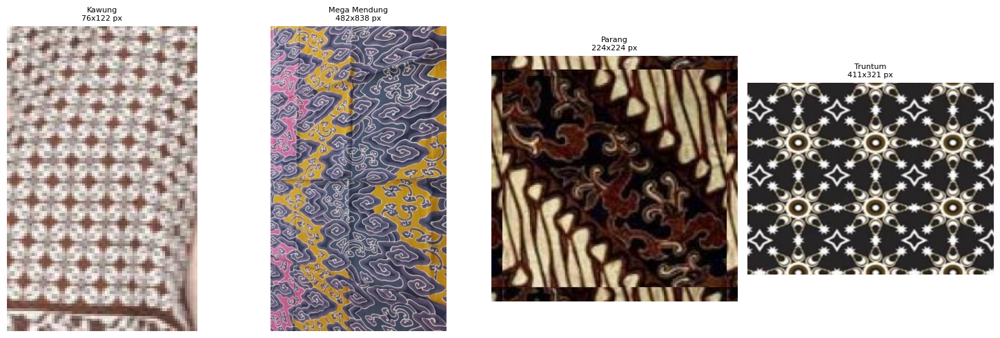

In [5]:
## Menampilkan Jumlah Dataset dari setiap kelas
total_dataset = 0
dataset_dir = zoom_test_dir
folders = [folder for folder in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, folder))]
# Check if folders is empty and handle it
if not folders:
    print("No folders found in the dataset directory. Please check the path.")
else:
    fig, axes = plt.subplots(1, len(folders), figsize=(15, 5))

    for i, folder in enumerate(folders):
        folder_path = os.path.join(dataset_dir, folder)
        image_count = len(os.listdir(folder_path))
        total_dataset += image_count
        print(f"Jumlah data {folder}: {image_count}")

        # Menampilkan foto secara acak dari setiap folder
        try:
            image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
            if image_files:
                random_image = random.choice(image_files)
                image_path = os.path.join(folder_path, random_image)
                img = Image.open(image_path)
                width, height = img.size

                # Menampilkan gambar di subplot horizontal
                axes[i].imshow(img)
                axes[i].set_title(f"{folder}\n{width}x{height} px", fontsize=8)
                axes[i].axis('off')
            else:
                print(f"Tidak ada gambar yang ditemukan di folder '{folder}'")
        except Exception as e:
            print(f"Error menampilkan gambar dari folder '{folder}': {e}")

    print(f"Jumlah Dataset Rotate: {total_dataset}")
    plt.tight_layout()
    plt.show()

In [6]:
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_image
    )

test_generator = datagen.flow_from_directory(
    directory=zoom_test_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

Found 584 images belonging to 4 classes.


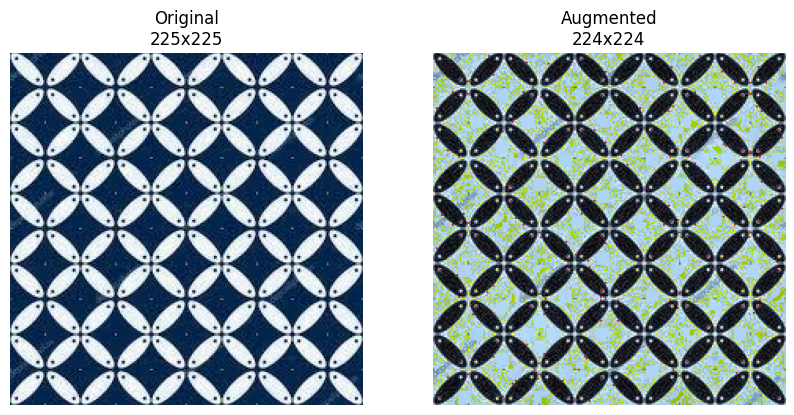

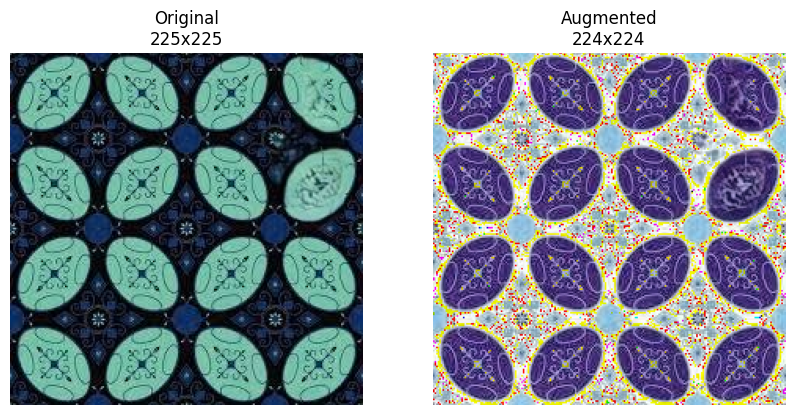

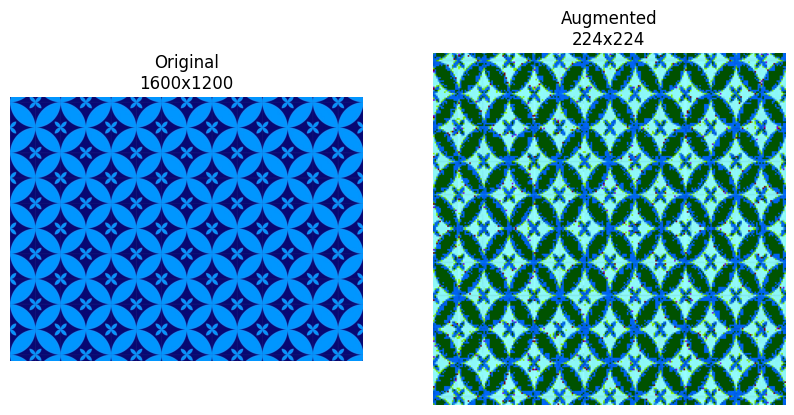

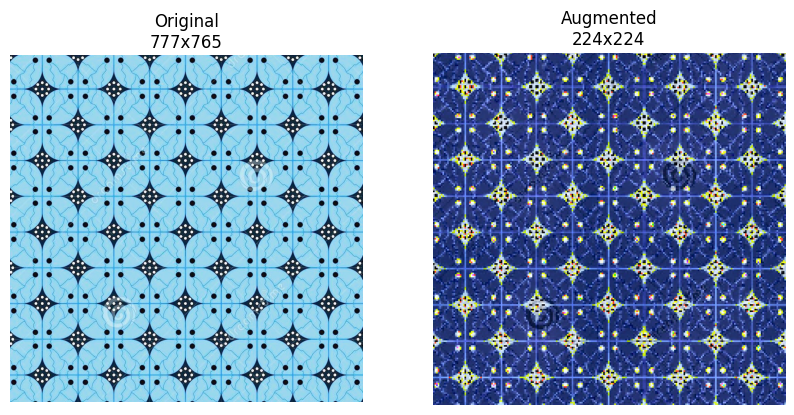

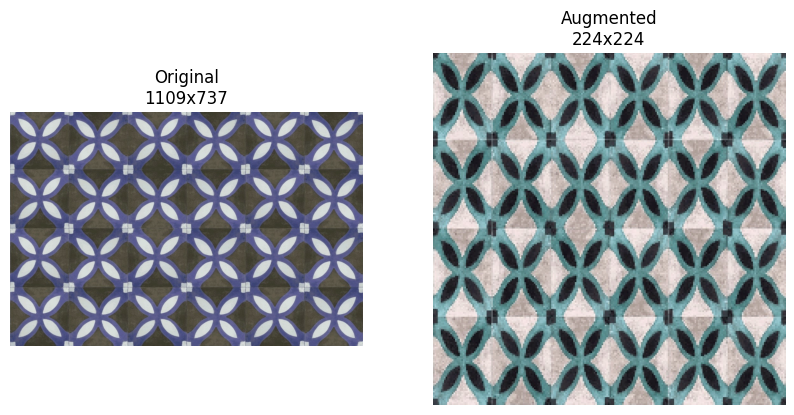

In [21]:
# Ambil satu batch gambar dari test generator
images, labels = next(test_generator)

# Tampilkan 5 gambar asli dan gambar yang telah diproses
for i in range(5):
    # Ambil path gambar asli
    img_path = test_generator.filepaths[test_generator.index_array[i]]
    
    # Baca gambar asli menggunakan OpenCV
    original_image = cv2.imread(img_path)
    # original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Konversi ke RGB untuk ditampilkan

    # Ambil gambar yang telah diproses oleh test_generator
    augmented_image = images[i]

    # Dapatkan dimensi gambar
    height_original, width_original, _ = original_image.shape
    height_augmented, width_augmented, _ = augmented_image.shape

    # Tampilkan gambar asli dan gambar yang telah diproses
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    
    # Tampilkan gambar asli
    axes[0].imshow(original_image)
    axes[0].set_title(f"Original\n{width_original}x{height_original}")
    axes[0].axis("off")

    # Tampilkan gambar yang telah diproses
    axes[1].imshow(augmented_image)
    axes[1].set_title(f"Augmented\n{width_augmented}x{height_augmented}")
    axes[1].axis("off")

    plt.show()


🚀 Training Fold 1 😌

Found 1843 validated image filenames belonging to 4 classes.
Found 461 validated image filenames belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 227s 4s/step - accuracy: 0.4022 - loss: 1.4395 - val_accuracy: 0.8764 - val_loss: 0.4941 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 183s 3s/step - accuracy: 0.7346 - loss: 0.6595 - val_accuracy: 0.9241 - val_loss: 0.2566 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 188s 3s/step - accuracy: 0.8399 - loss: 0.4298 - val_accuracy: 0.9414 - val_loss: 0.1756 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 177s 3s/step - accuracy: 0.8977 - loss: 0.2769 - val_accuracy: 0.9479 - val_loss: 0.1508 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 172s 3s/step - accuracy: 0.9136 - loss: 0.2170 - val_accuracy: 0.9675 - val_loss: 0.0883 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 172s 3s/step - accuracy: 0.9455 - loss: 0.1755 - val_accuracy: 0.9653 - val_loss: 0.0997 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 173s 3s/step - accuracy: 0.9507 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\3213838512.py:128: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\3213838512.py:137: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


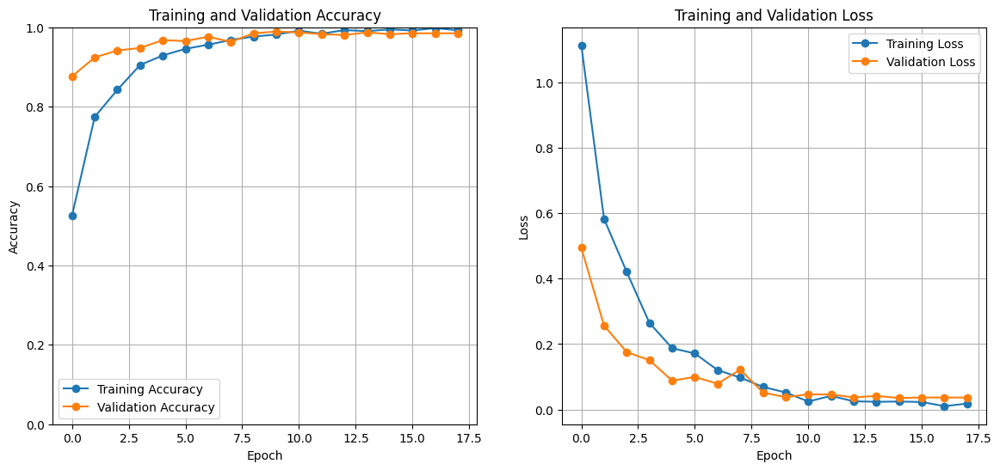

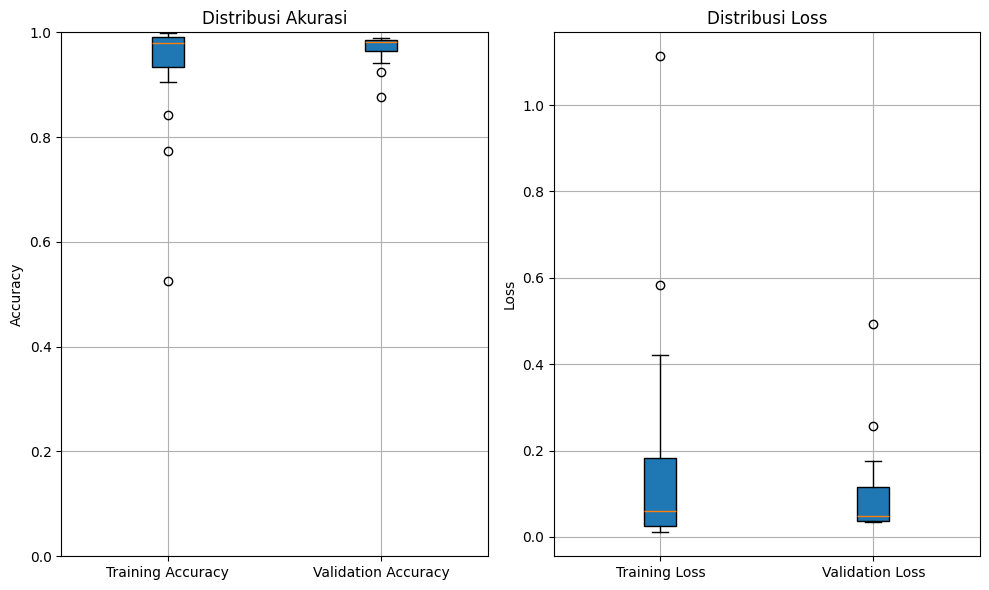


🚀 Training Fold 2 😌

Found 1843 validated image filenames belonging to 4 classes.
Found 461 validated image filenames belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 189s 3s/step - accuracy: 0.5088 - loss: 1.1716 - val_accuracy: 0.9067 - val_loss: 0.3636 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 155s 3s/step - accuracy: 0.8190 - loss: 0.4998 - val_accuracy: 0.9414 - val_loss: 0.1882 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 156s 3s/step - accuracy: 0.8887 - loss: 0.3166 - val_accuracy: 0.9501 - val_loss: 0.1534 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 156s 3s/step - accuracy: 0.9268 - loss: 0.2021 - val_accuracy: 0.9544 - val_loss: 0.1300 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 158s 3s/step - accuracy: 0.9545 - loss: 0.1294 - val_accuracy: 0.9523 - val_loss: 0.1320 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 166s 3s/step - accuracy: 0.9669 - loss: 0.1061 - val_accuracy: 0.9588 - val_loss: 0.1265 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.9818 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\3213838512.py:128: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\3213838512.py:137: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


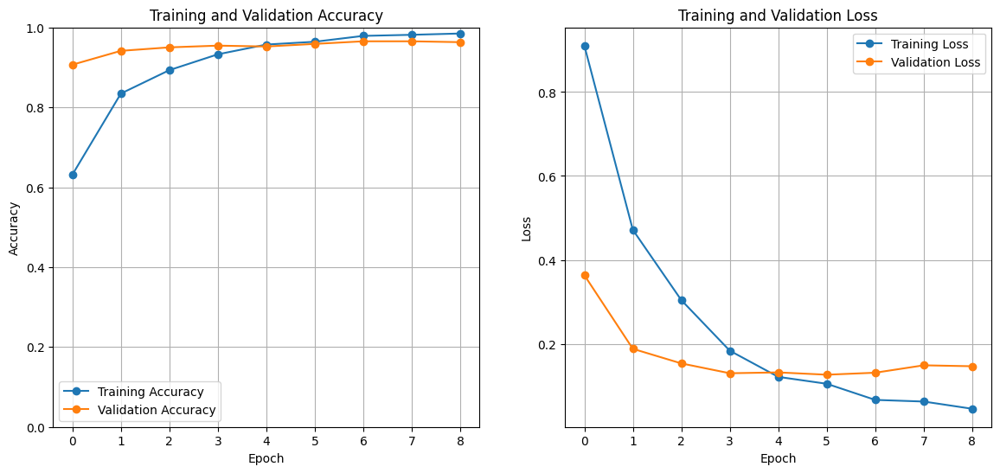

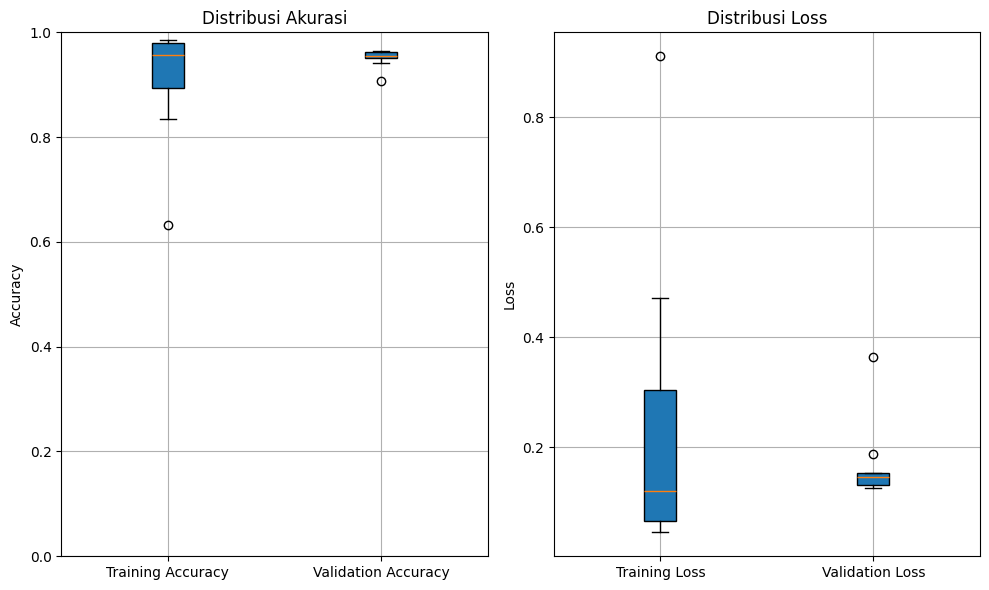


🚀 Training Fold 3 😌

Found 1843 validated image filenames belonging to 4 classes.
Found 461 validated image filenames belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 191s 3s/step - accuracy: 0.4924 - loss: 1.2742 - val_accuracy: 0.8959 - val_loss: 0.4242 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 167s 3s/step - accuracy: 0.7593 - loss: 0.6144 - val_accuracy: 0.9436 - val_loss: 0.2051 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 165s 3s/step - accuracy: 0.8470 - loss: 0.3944 - val_accuracy: 0.9610 - val_loss: 0.1202 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 166s 3s/step - accuracy: 0.9063 - loss: 0.2631 - val_accuracy: 0.9610 - val_loss: 0.1228 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 167s 3s/step - accuracy: 0.9457 - loss: 0.1709 - val_accuracy: 0.9696 - val_loss: 0.0911 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 164s 3s/step - accuracy: 0.9611 - loss: 0.1176 - val_accuracy: 0.9740 - val_loss: 0.0858 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 166s 3s/step - accuracy: 0.9680 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\3213838512.py:128: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\3213838512.py:137: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


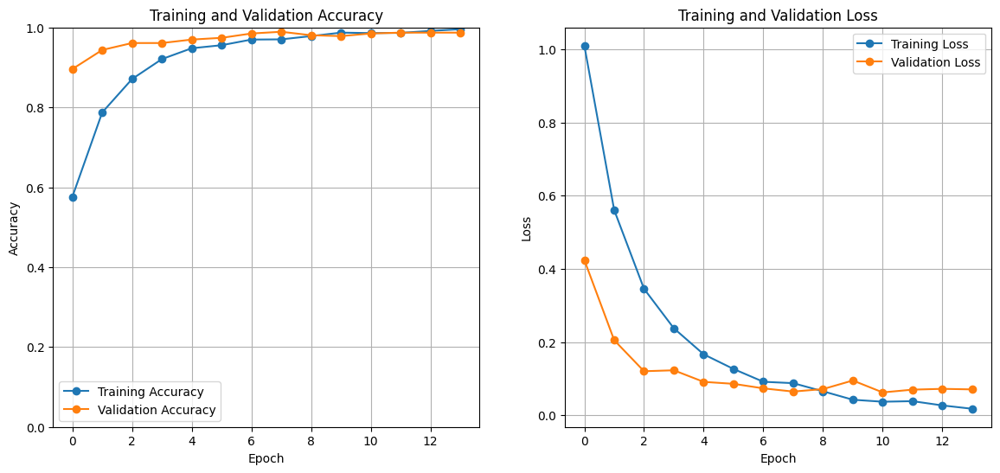

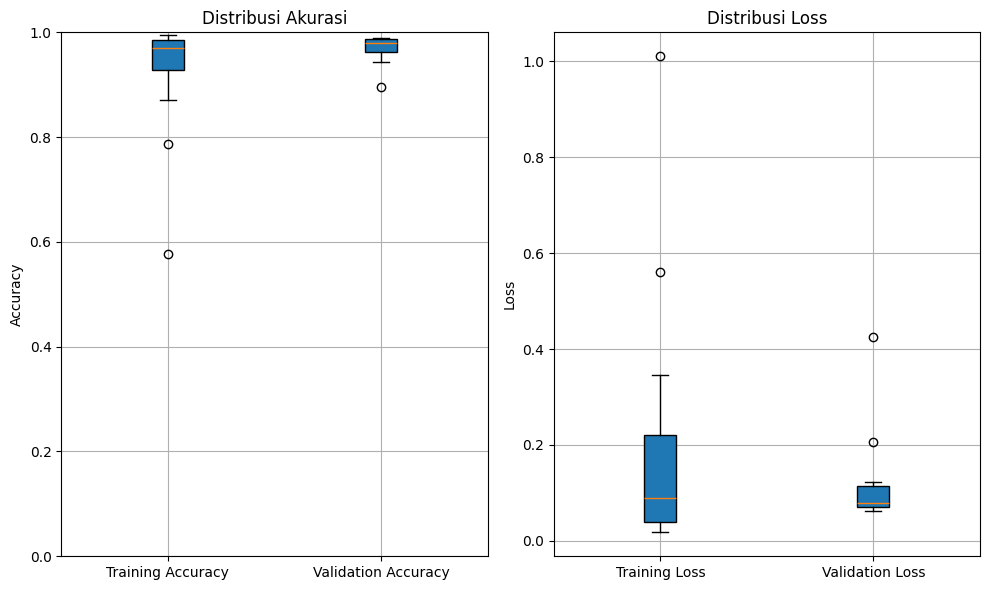


🚀 Training Fold 4 😌

Found 1843 validated image filenames belonging to 4 classes.
Found 461 validated image filenames belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 188s 3s/step - accuracy: 0.4601 - loss: 1.3338 - val_accuracy: 0.9241 - val_loss: 0.4464 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.7644 - loss: 0.5874 - val_accuracy: 0.9501 - val_loss: 0.1906 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.8537 - loss: 0.3789 - val_accuracy: 0.9653 - val_loss: 0.1351 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.9118 - loss: 0.2404 - val_accuracy: 0.9696 - val_loss: 0.1124 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9421 - loss: 0.1623 - val_accuracy: 0.9805 - val_loss: 0.0625 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9690 - loss: 0.1091 - val_accuracy: 0.9870 - val_loss: 0.0456 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9686 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\3213838512.py:128: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\3213838512.py:137: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


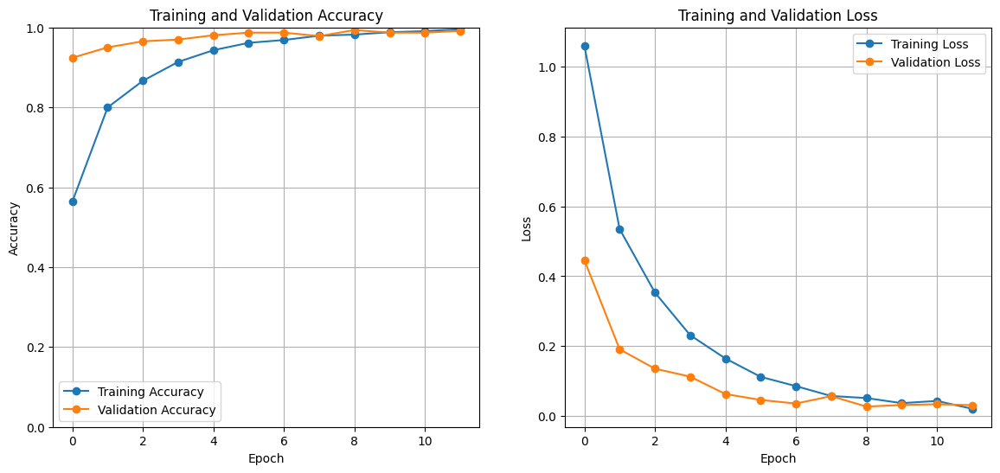

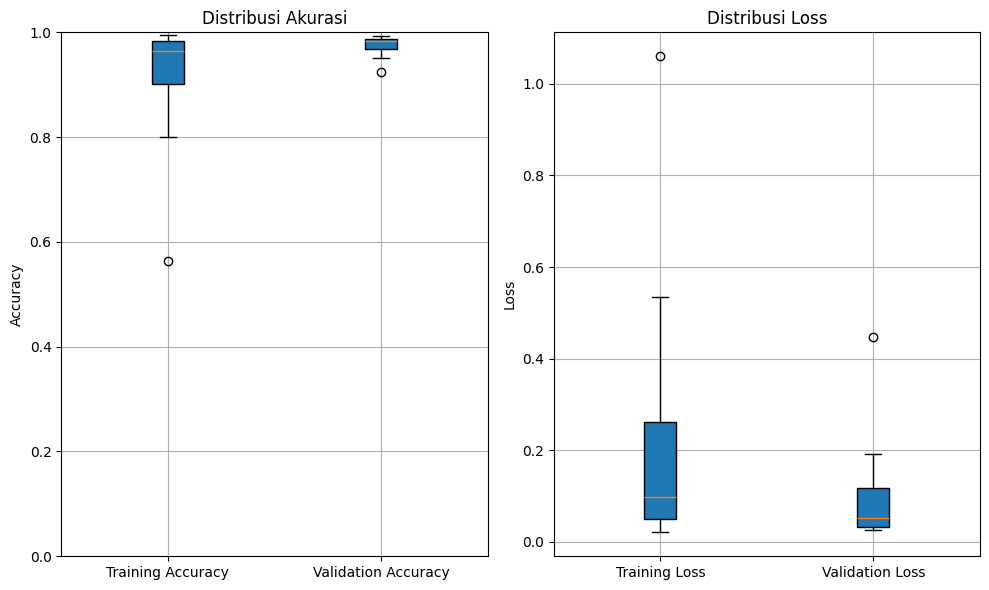


🚀 Training Fold 5 😌

Found 1844 validated image filenames belonging to 4 classes.
Found 460 validated image filenames belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 186s 3s/step - accuracy: 0.4418 - loss: 1.3606 - val_accuracy: 0.8739 - val_loss: 0.5915 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 166s 3s/step - accuracy: 0.7292 - loss: 0.7061 - val_accuracy: 0.9239 - val_loss: 0.2689 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 163s 3s/step - accuracy: 0.8373 - loss: 0.4200 - val_accuracy: 0.9543 - val_loss: 0.1761 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9020 - loss: 0.2708 - val_accuracy: 0.9674 - val_loss: 0.1254 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9081 - loss: 0.2396 - val_accuracy: 0.9674 - val_loss: 0.1022 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9491 - loss: 0.1394 - val_accuracy: 0.9696 - val_loss: 0.0991 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 163s 3s/step - accuracy: 0.9626 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\3213838512.py:128: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\3213838512.py:137: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


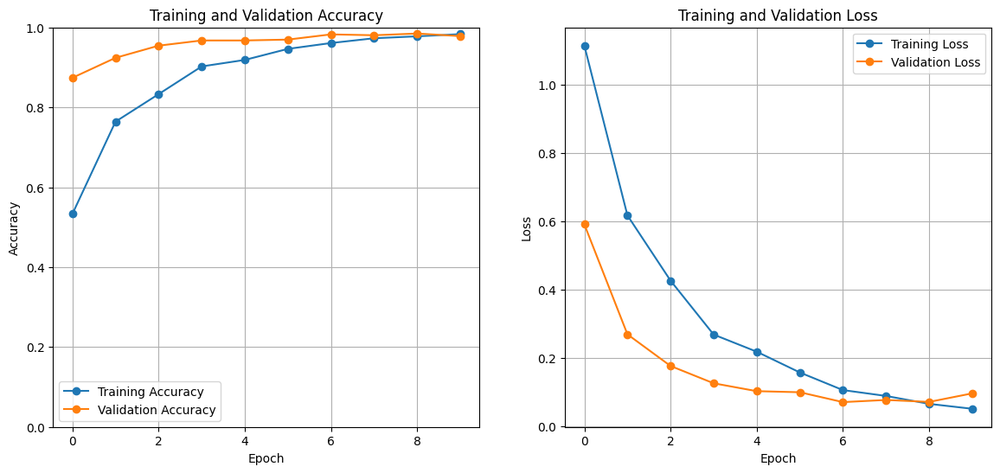

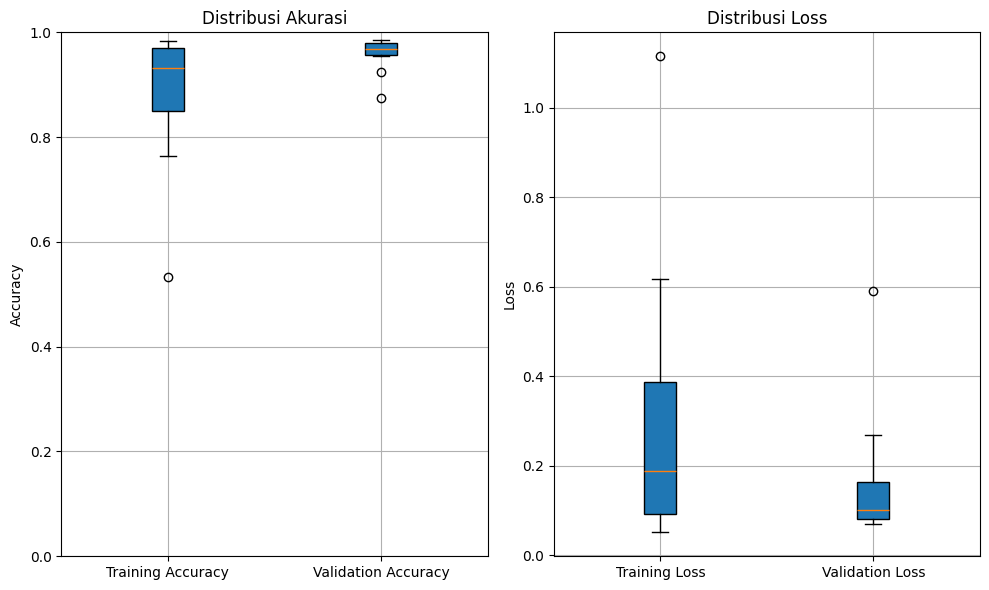

In [13]:
# Implementasi Kfold
n_splits = 5
EPOCH = 25

# Inisialisasi KFold
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Direktori untuk menyimpan model terbaik
best_model_dir = r'.\keras aug\zoom in\A1' # Mendefinisikan best_model_dir di luar fungsi
# Fungsi untuk membuat model
def create_model(num_classes):
    base_model = DenseNet169(
        weights='imagenet', 
        include_top=False, 
        input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, COLOR_CHANNELS))
    
    # Membekukan 596 layer awal dari DenseNet169
    for layer in base_model.layers[:-10]:  
        layer.trainable = False

    # Custom Layer base model
    x = base_model.output
    x = Conv2D(32, (4, 4), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu', name='FC2')(x) 
    x = Dropout(0.3)(x)
    x = Flatten()(x)
    x = Dropout(0.3)(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(optimizer=RMSprop(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
    
    # model.summary()
    return model

fold_var = 1 # Inisialisasi variabel fold
for train_index, val_index in kf.split(file_paths):
    print(f"\n🚀 Training Fold {fold_var} 😌\n")

    # Split train and validation sets
    train_files, val_files = np.array(file_paths)[train_index], np.array(file_paths)[val_index]
    train_labels, val_labels = np.array(integer_labels)[train_index], np.array(integer_labels)[val_index]
    
    # Convert integer labels to class names
    df_train = pd.DataFrame({"filename": train_files, "class": [unique_labels[i] for i in train_labels]})
    df_val = pd.DataFrame({"filename": val_files, "class": [unique_labels[i] for i in val_labels]})


    train_generator = datagen.flow_from_dataframe(
        dataframe=df_train,       # DataFrame yang berisi informasi gambar (filename dan class)
        x_col="filename",         # Kolom yang berisi path ke gambar
        y_col="class",            # Kolom yang berisi label kelas gambar
        target_size=IMAGE_SIZE,   # Ukuran gambar yang akan diubah sebelum masuk ke model
        batch_size=BATCH_SIZE,    # Jumlah gambar yang akan diproses dalam satu batch
        class_mode="categorical", # Mode klasifikasi (multikategori)
        color_mode="rgb",         # Format warna gambar (RGB)
        shuffle=True
    )
    
    val_generator = datagen.flow_from_dataframe(
        dataframe=df_val,
        x_col="filename",
        y_col="class",
        target_size=IMAGE_SIZE,
        batch_size=BATCH_SIZE,
        class_mode="categorical",
        color_mode="rgb",
        shuffle=True
    )

    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)
    model_checkpoint = ModelCheckpoint(os.path.join(best_model_dir, f'zoom_model_{fold_var}.keras'), monitor='val_loss', save_best_only=True)
    
    # Buat Learning Rate Scheduler
    lr_scheduler =  ReduceLROnPlateau(
        monitor='val_accuracy',     
        factor=0.1,             
        patience=3,             # Jika val_loss tidak membaik setelah 3 epoch, LR akan diturunkan
        min_lr=1e-6,            
        verbose=1               
    )

    num_classes = 4
    model = create_model(num_classes)

    # Training Model
    history = model.fit(
        train_generator,
        epochs=EPOCH,
        validation_data=val_generator,
        callbacks=[early_stopping, model_checkpoint, lr_scheduler]
    )

    # Plot grafik akurasi dan loss dengan format yang lebih baik
    plt.figure(figsize=(14, 6))

    # Plot Training and Validation Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1)  # Menentukan rentang y antara 0 dan 1 (untuk akurasi)
    plt.grid(True)
    plt.legend()

    # Plot Training and Validation Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.legend()


    # Buat figure Box Plot
    plt.figure(figsize=(10, 6))
    
    # Boxplot untuk Training & Validation Accuracy
    plt.subplot(1, 2, 1)
    plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
                labels=['Training Accuracy', 'Validation Accuracy'])
    plt.title('Distribusi Akurasi')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1)
    plt.grid(True)
    
    # Boxplot untuk Training & Validation Loss
    plt.subplot(1, 2, 2)
    plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,
                labels=['Training Loss', 'Validation Loss'])
    plt.title('Distribusi Loss')
    plt.ylabel('Loss')
    plt.grid(True)

    # Tampilkan grafik
    plt.tight_layout()
    plt.show()

    fold_var += 1

In [14]:
import numpy as np

# Contoh hasil akurasi dari 5 fold
accuracies = [98.26, 95.88, 98.48, 99.35, 98.26]

# Menghitung standar deviasi
std_dev = np.std(accuracies)

print(f"Standar Deviasi Akurasi Model A1: {std_dev:.4f}")

Standar Deviasi Akurasi Model A1: 1.1552





zoom model 1 ...


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 49s 2s/step


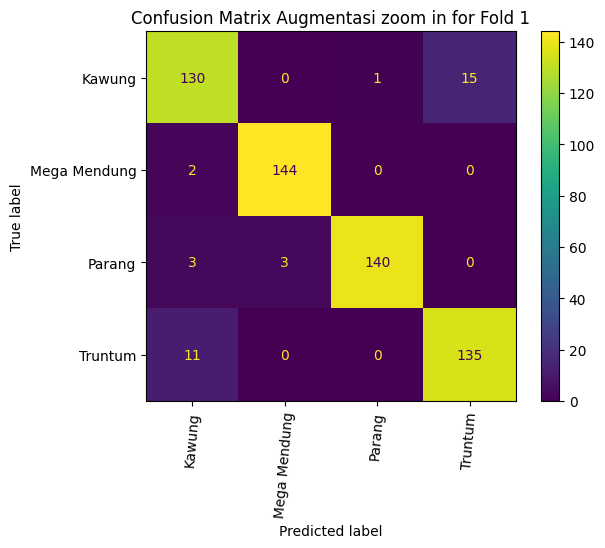

Classification Report
              precision    recall  f1-score   support

      Kawung     0.8904    0.8904    0.8904       146
Mega Mendung     0.9796    0.9863    0.9829       146
      Parang     0.9929    0.9589    0.9756       146
     Truntum     0.9000    0.9247    0.9122       146

    accuracy                         0.9401       584
   macro avg     0.9407    0.9401    0.9403       584
weighted avg     0.9407    0.9401    0.9403       584




zoom model 2 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 51s 2s/step


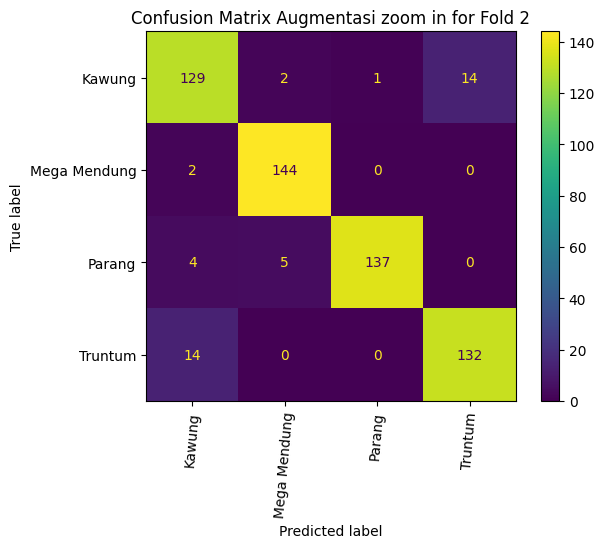

Classification Report
              precision    recall  f1-score   support

      Kawung     0.8658    0.8836    0.8746       146
Mega Mendung     0.9536    0.9863    0.9697       146
      Parang     0.9928    0.9384    0.9648       146
     Truntum     0.9041    0.9041    0.9041       146

    accuracy                         0.9281       584
   macro avg     0.9291    0.9281    0.9283       584
weighted avg     0.9291    0.9281    0.9283       584




zoom model 3 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 60s 3s/step


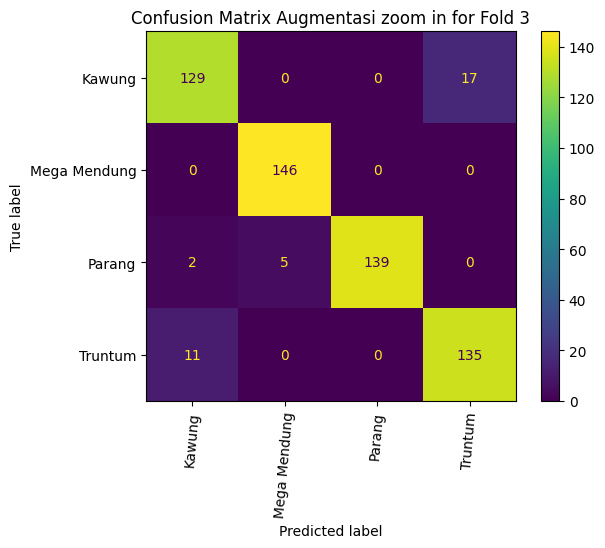

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9085    0.8836    0.8958       146
Mega Mendung     0.9669    1.0000    0.9832       146
      Parang     1.0000    0.9521    0.9754       146
     Truntum     0.8882    0.9247    0.9060       146

    accuracy                         0.9401       584
   macro avg     0.9409    0.9401    0.9401       584
weighted avg     0.9409    0.9401    0.9401       584




zoom model 4 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step


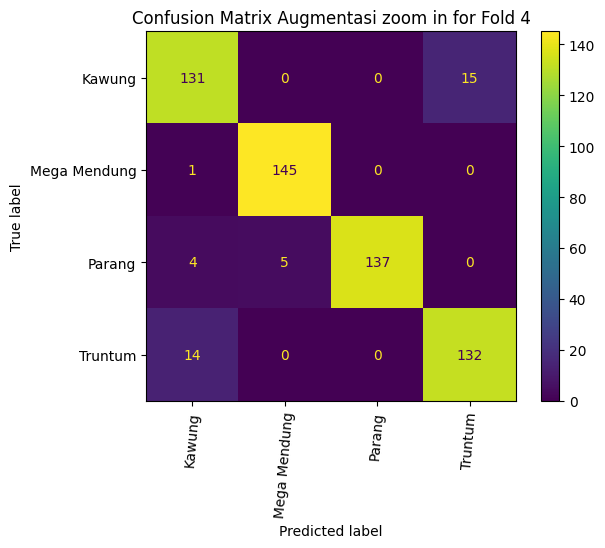

Classification Report
              precision    recall  f1-score   support

      Kawung     0.8733    0.8973    0.8851       146
Mega Mendung     0.9667    0.9932    0.9797       146
      Parang     1.0000    0.9384    0.9682       146
     Truntum     0.8980    0.9041    0.9010       146

    accuracy                         0.9332       584
   macro avg     0.9345    0.9332    0.9335       584
weighted avg     0.9345    0.9332    0.9335       584




zoom model 5 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step


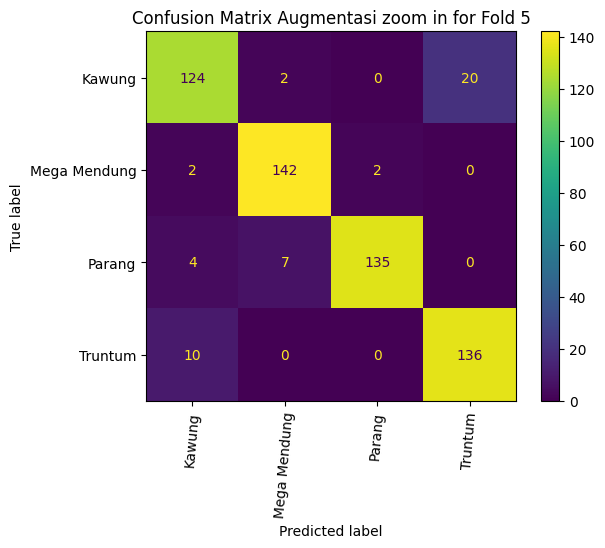

Classification Report
              precision    recall  f1-score   support

      Kawung     0.8857    0.8493    0.8671       146
Mega Mendung     0.9404    0.9726    0.9562       146
      Parang     0.9854    0.9247    0.9541       146
     Truntum     0.8718    0.9315    0.9007       146

    accuracy                         0.9195       584
   macro avg     0.9208    0.9195    0.9195       584
weighted avg     0.9208    0.9195    0.9195       584



In [7]:
def evaluate_model(fold_count, test_generator, model_path='./keras aug/zoom in/A1/zoom_model_'):
    for fold in range(1, fold_count + 1):
        print('\n\n')
        print(f"zoom model {fold} ...")
        loaded_model = load_model(f'{model_path}{fold}.keras')
        
        predictions = loaded_model.predict(test_generator)
        
        # Get class labels
        class_labels = list(test_generator.class_indices.keys())
        
        # Get the true and predicted class indices
        y_true = test_generator.classes
        y_pred = np.argmax(predictions, axis=1)
        
        # Confusion Matrix Display
        conf_matrix = confusion_matrix(y_true, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_labels)
        
        disp.plot(cmap='viridis')
        plt.title(f'Confusion Matrix Augmentasi zoom in for Fold {fold}')
        plt.xticks(rotation=85)
        plt.show()
        
        class_report = classification_report(y_true, y_pred, target_names=class_labels, digits=4)
        print('Classification Report')
        print(class_report)

evaluate_model(fold_count=5, test_generator=test_generator)

# dataset clean (1444 x 2 = 2888) 2308 + 580 optimasi hyperparameter + augmentasi zoom in

In [7]:
asal_dir = r'..\..\dataset\Dataset 1444'
base_dir = r'..\..\dataset\Dataset Ori + Aug\zoom in'
train_dir = r'..\..\dataset\Dataset Ori + Aug\zoom\train'
test_dir = r'..\..\dataset\Dataset Ori + Aug\zoom\test'

# if not os.path.exists(base_dir):
#     os.makedirs(base_dir)

if not os.path.exists(test_dir):
    os.makedirs(test_dir)

if not os.path.exists(train_dir):
    os.makedirs(train_dir)

In [ ]:
# # menyalin gambar test ke gabungan

# # Loop melalui setiap folder 
# for label in os.listdir(asal_dir):
#     label_path = os.path.join(asal_dir, label)
    
#     # Pastikan ini adalah direktori
#     if os.path.isdir(label_path):
#         # Buat direktori label di gabungan_dir jika belum ada
#         gabungan_label_dir = os.path.join(base_dir, label)
#         if not os.path.exists(gabungan_label_dir):
#             os.makedirs(gabungan_label_dir)
        
#         # Loop melalui setiap gambar di folder label
#         for image_name in os.listdir(label_path):
#             image_path = os.path.join(label_path, image_name)
            
#             # Salin gambar ke direktori gabungan
#             shutil.copy(image_path, gabungan_label_dir)

# print("Semua gambar dari telah disalin")

Semua gambar dari telah disalin


In [ ]:
# # Menambahkan dataset augmentasi di lokal

# datagen = ImageDataGenerator(zoom_range=0.2,
#     fill_mode='wrap')

# for label in os.listdir(base_dir):
#     label_path = os.path.join(base_dir, label)
    
#     if os.path.isdir(label_path):
#         for file in os.listdir(label_path):
#             img_path = os.path.join(label_path, file)

#             # Load gambar
#             img = load_img(img_path)
#             img_array = img_to_array(img)
#             img_array = np.expand_dims(img_array, axis=0)

#             # Hasil augmentasi
#             aug_iter = datagen.flow(img_array, batch_size=1)

#             for i in range(1):
#                 aug_img = next(aug_iter)[0].astype(np.uint8)
#                 aug_img_pil = array_to_img(aug_img)

#                 # Simpan gambar hasil augmentasi di lokasi asli
#                 save_path = os.path.join(label_path, f'aug_{file}')
#                 aug_img_pil.save(save_path)

# print("Augmentasi selesai dan gambar berhasil disimpan.")

Augmentasi selesai dan gambar berhasil disimpan.


In [3]:
# Ambil semua file gambar dari dataset asli
file_paths = []
labels = []

# Ambil file dari train_dir (data asli)
for label in os.listdir(train_dir):
    label_path = os.path.join(train_dir, label)
    if os.path.isdir(label_path):
        for file in os.listdir(label_path):
            file_paths.append(os.path.join(label_path, file))
            labels.append(label)

# Map label ke integer
unique_labels = sorted(set(labels))
label_map = {label: idx for idx, label in enumerate(unique_labels)}
integer_labels = [label_map[label] for label in labels]

print(f"Jumlah total gambar: {len(file_paths)}")
print(unique_labels)
print(len(label_map))
print(label_map)
print(integer_labels)

Jumlah total gambar: 2308
['Kawung', 'Mega Mendung', 'Parang', 'Truntum']
4
{'Kawung': 0, 'Mega Mendung': 1, 'Parang': 2, 'Truntum': 3}
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [ ]:
# # Membagi data train dan test setelah augmentasi data

# # Membuat folder untuk data train dan test jika belum ada
# os.makedirs(train_dir, exist_ok=True)
# os.makedirs(test_dir, exist_ok=True)

# # Mendapatkan daftar kelas (subfolder dalam dataset)
# classes = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]

# # Membagi data per kelas
# for cls in classes:
#     cls_path = os.path.join(base_dir, cls)

#     # Membuat folder kelas di train dan test
#     os.makedirs(os.path.join(train_dir, cls), exist_ok=True)
#     os.makedirs(os.path.join(test_dir, cls), exist_ok=True)

#     # Mendapatkan daftar file gambar dalam kelas
#     images = os.listdir(cls_path)

#     # Membagi gambar menjadi 80% train dan 20% test
#     train_imgs, test_imgs = train_test_split(images, test_size=0.2, random_state=42)

#     # Memindahkan file ke folder train dan test
#     for img in train_imgs:
#         shutil.move(os.path.join(cls_path, img), os.path.join(train_dir, cls, img))
#     for img in test_imgs:
#         shutil.move(os.path.join(cls_path, img), os.path.join(test_dir, cls, img))

# print("Pembagian dataset selesai.")

Pembagian dataset selesai.


Jumlah data Kawung: 577
Jumlah data Mega Mendung: 577
Jumlah data Parang: 577
Jumlah data Truntum: 577
Jumlah Dataset Rotate: 2308


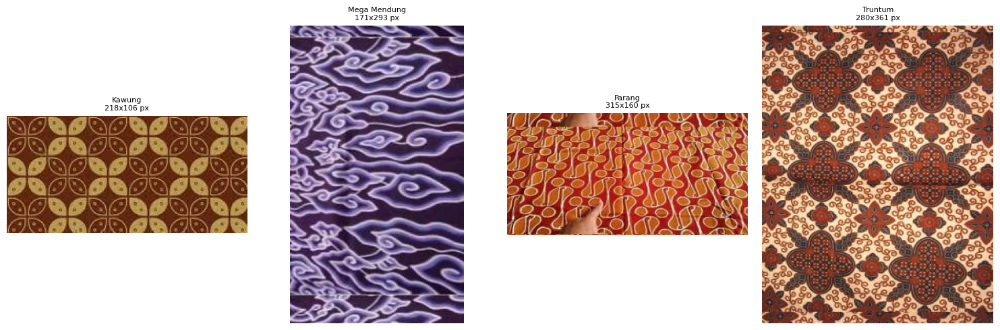

In [4]:
## Menampilkan Jumlah Dataset dari setiap kelas
total_dataset = 0
dataset = train_dir
folders = [folder for folder in os.listdir(dataset) if os.path.isdir(os.path.join(dataset, folder))]
# Check if folders is empty and handle it
if not folders:
    print("No folders found in the dataset directory. Please check the path.")
else:
    fig, axes = plt.subplots(1, len(folders), figsize=(15, 5))

    for i, folder in enumerate(folders):
        folder_path = os.path.join(dataset, folder)
        image_count = len(os.listdir(folder_path))
        total_dataset += image_count
        print(f"Jumlah data {folder}: {image_count}")

        # Menampilkan foto secara acak dari setiap folder
        try:
            image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
            if image_files:
                random_image = random.choice(image_files)
                image_path = os.path.join(folder_path, random_image)
                img = Image.open(image_path)
                width, height = img.size

                # Menampilkan gambar di subplot horizontal
                axes[i].imshow(img)
                axes[i].set_title(f"{folder}\n{width}x{height} px", fontsize=8)
                axes[i].axis('off')
            else:
                print(f"Tidak ada gambar yang ditemukan di folder '{folder}'")
        except Exception as e:
            print(f"Error menampilkan gambar dari folder '{folder}': {e}")

    print(f"Jumlah Dataset Rotate: {total_dataset}")
    plt.tight_layout()
    plt.show()

In [8]:
IMAGE_WIDTH = 224
IMAGE_HEIGHT = 224
IMAGE_SIZE = (IMAGE_WIDTH, IMAGE_HEIGHT)
BATCH_SIZE = 32
COLOR_CHANNELS = 3

In [9]:
# Fungsi preprocessing menggunakan CLAHE
# CLAHE akan meningkatkan kontras gambar sehingga fitur lebih terlihat
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
def preprocess_image(image):
    # Konversi nilai dari 0-1 ke 0-255 dan ubah tipe data ke uint8
    image = (image * 255).astype(np.uint8)
    
    # Konversi ke LAB color space
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    
    # Pisahkan channel L, A, dan B
    l, a, b = cv2.split(lab)
    
    # Terapkan CLAHE pada channel L (grayscale)
    l = clahe.apply(l)
    
    # Gabungkan kembali ke LAB
    lab = cv2.merge((l, a, b))
    
    # Konversi kembali ke RGB
    image = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
    
    # Normalisasi kembali ke 0-1
    image = image / 255.0

    return image

In [10]:
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_image
)

test_generator = datagen.flow_from_directory(
    directory=test_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False
)

Found 580 images belonging to 4 classes.



🚀 Training Fold 1 😌

Found 1846 validated image filenames belonging to 4 classes.
Found 462 validated image filenames belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 221s 3s/step - accuracy: 0.4375 - loss: 1.3527 - val_accuracy: 0.9156 - val_loss: 0.4684 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 180s 3s/step - accuracy: 0.7525 - loss: 0.6556 - val_accuracy: 0.9567 - val_loss: 0.2065 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 178s 3s/step - accuracy: 0.8399 - loss: 0.4071 - val_accuracy: 0.9567 - val_loss: 0.1289 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 180s 3s/step - accuracy: 0.8969 - loss: 0.3087 - val_accuracy: 0.9654 - val_loss: 0.1030 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 178s 3s/step - accuracy: 0.9247 - loss: 0.2035 - val_accuracy: 0.9675 - val_loss: 0.0907 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 179s 3s/step - accuracy: 0.9575 - loss: 0.1221 - val_accuracy: 0.9805 - val_loss: 0.0729 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 183s 3s/step - accuracy: 0.9528 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\2190934247.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\2190934247.py:132: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


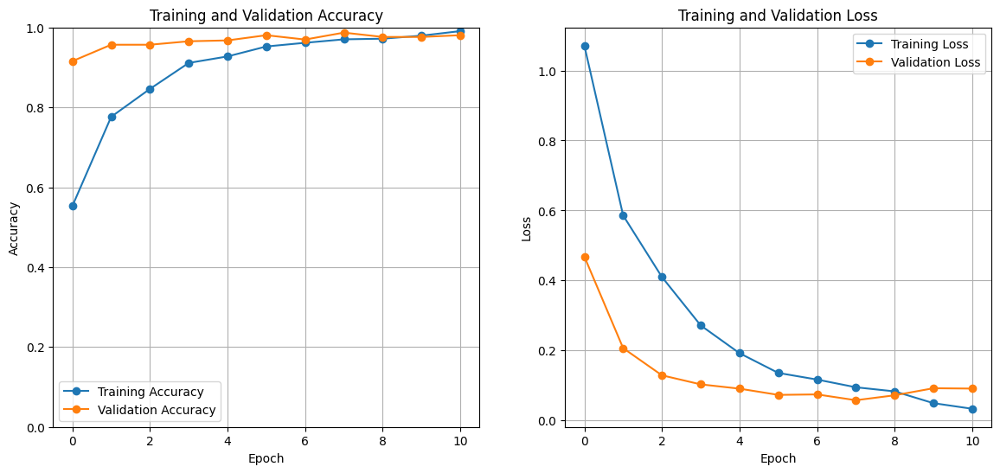

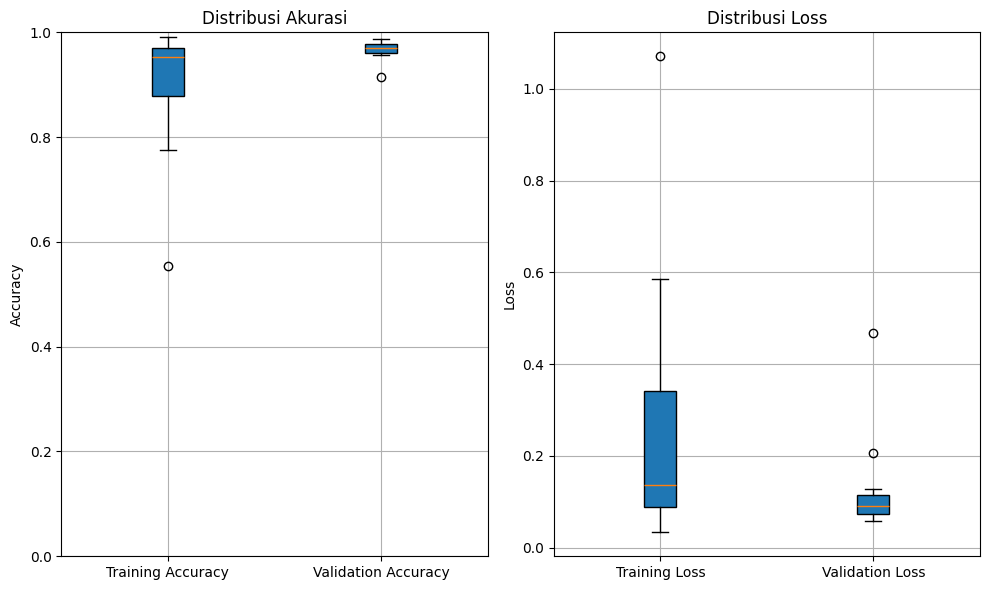


🚀 Training Fold 2 😌

Found 1846 validated image filenames belonging to 4 classes.
Found 462 validated image filenames belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 197s 3s/step - accuracy: 0.4431 - loss: 1.3907 - val_accuracy: 0.9242 - val_loss: 0.4199 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 177s 3s/step - accuracy: 0.7901 - loss: 0.5656 - val_accuracy: 0.9351 - val_loss: 0.2031 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 179s 3s/step - accuracy: 0.8466 - loss: 0.4227 - val_accuracy: 0.9589 - val_loss: 0.1567 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 177s 3s/step - accuracy: 0.9017 - loss: 0.2607 - val_accuracy: 0.9610 - val_loss: 0.1396 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 179s 3s/step - accuracy: 0.9444 - loss: 0.1897 - val_accuracy: 0.9610 - val_loss: 0.1263 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 174s 3s/step - accuracy: 0.9493 - loss: 0.1464 - val_accuracy: 0.9589 - val_loss: 0.1140 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 173s 3s/step - accuracy: 0.9609 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\2190934247.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\2190934247.py:132: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


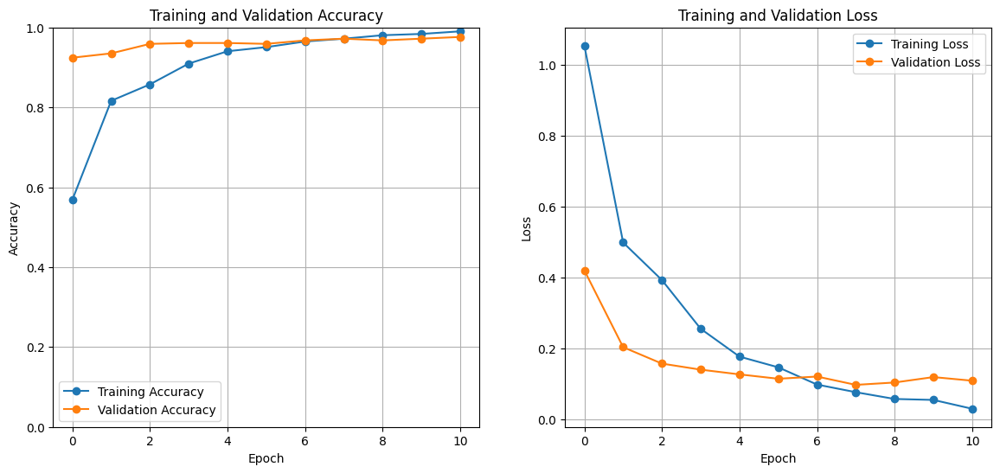

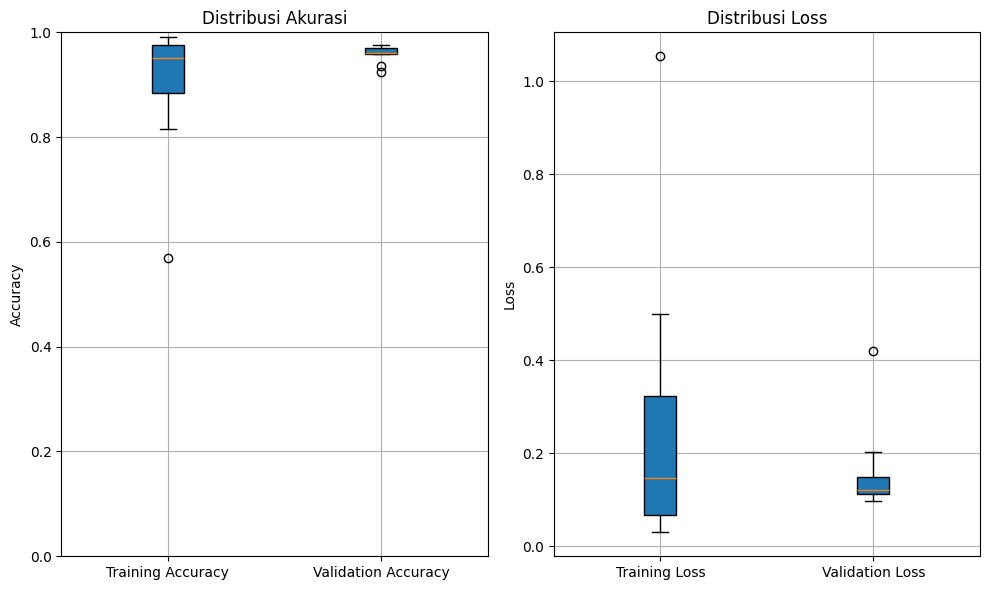


🚀 Training Fold 3 😌

Found 1846 validated image filenames belonging to 4 classes.
Found 462 validated image filenames belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 187s 3s/step - accuracy: 0.4632 - loss: 1.3014 - val_accuracy: 0.8571 - val_loss: 0.4943 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 165s 3s/step - accuracy: 0.7674 - loss: 0.6249 - val_accuracy: 0.9264 - val_loss: 0.2951 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 165s 3s/step - accuracy: 0.8658 - loss: 0.3684 - val_accuracy: 0.9372 - val_loss: 0.1809 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 164s 3s/step - accuracy: 0.9095 - loss: 0.2529 - val_accuracy: 0.9481 - val_loss: 0.1297 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 165s 3s/step - accuracy: 0.9326 - loss: 0.1887 - val_accuracy: 0.9545 - val_loss: 0.1176 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 165s 3s/step - accuracy: 0.9436 - loss: 0.1558 - val_accuracy: 0.9632 - val_loss: 0.1050 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 165s 3s/step - accuracy: 0.9659 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\2190934247.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\2190934247.py:132: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


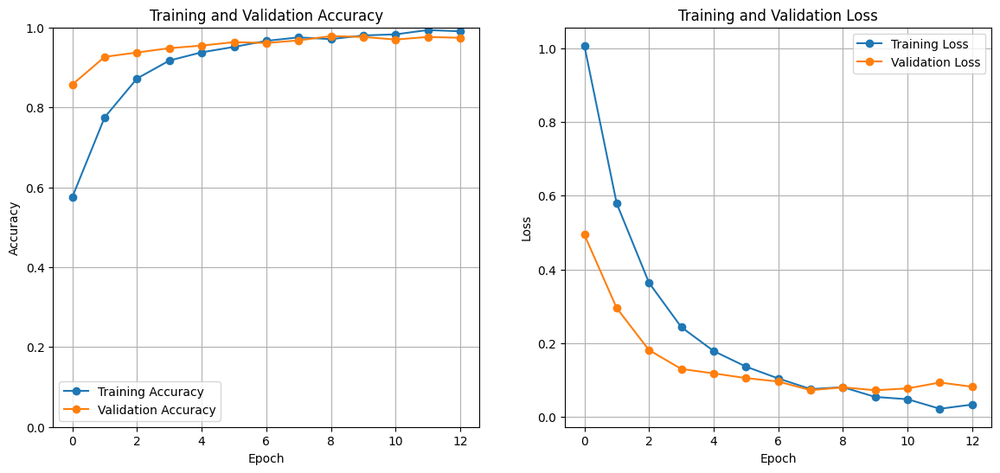

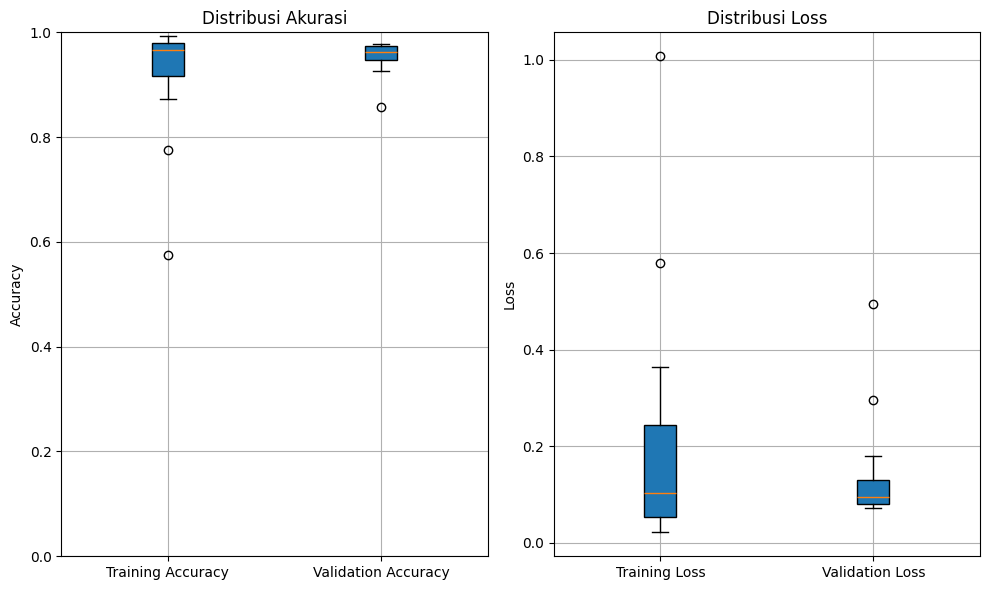


🚀 Training Fold 4 😌

Found 1847 validated image filenames belonging to 4 classes.
Found 461 validated image filenames belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 187s 3s/step - accuracy: 0.4338 - loss: 1.3933 - val_accuracy: 0.8764 - val_loss: 0.4880 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 165s 3s/step - accuracy: 0.7190 - loss: 0.6817 - val_accuracy: 0.9328 - val_loss: 0.2712 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 165s 3s/step - accuracy: 0.8334 - loss: 0.4462 - val_accuracy: 0.9566 - val_loss: 0.1637 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 165s 3s/step - accuracy: 0.8683 - loss: 0.3435 - val_accuracy: 0.9740 - val_loss: 0.0961 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 165s 3s/step - accuracy: 0.9137 - loss: 0.2503 - val_accuracy: 0.9718 - val_loss: 0.0790 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 164s 3s/step - accuracy: 0.9387 - loss: 0.1729 - val_accuracy: 0.9718 - val_loss: 0.0807 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 165s 3s/step - accuracy: 0.9501 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\2190934247.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\2190934247.py:132: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


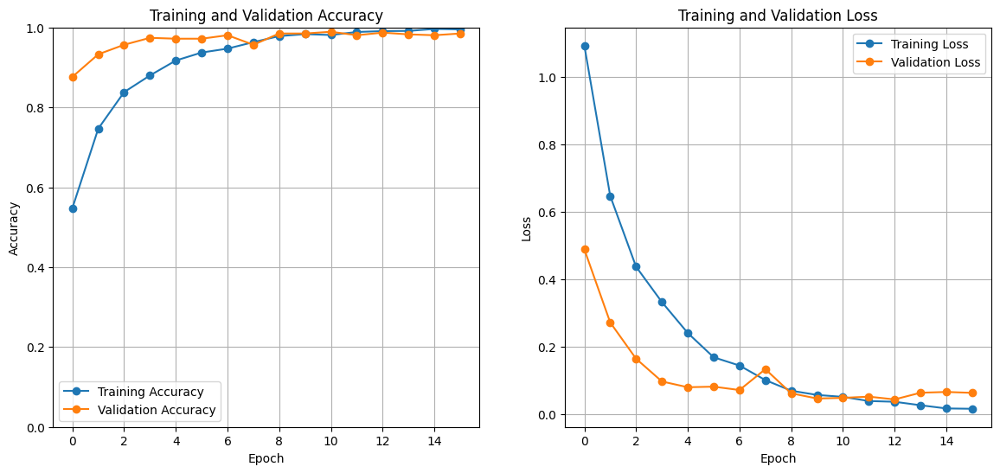

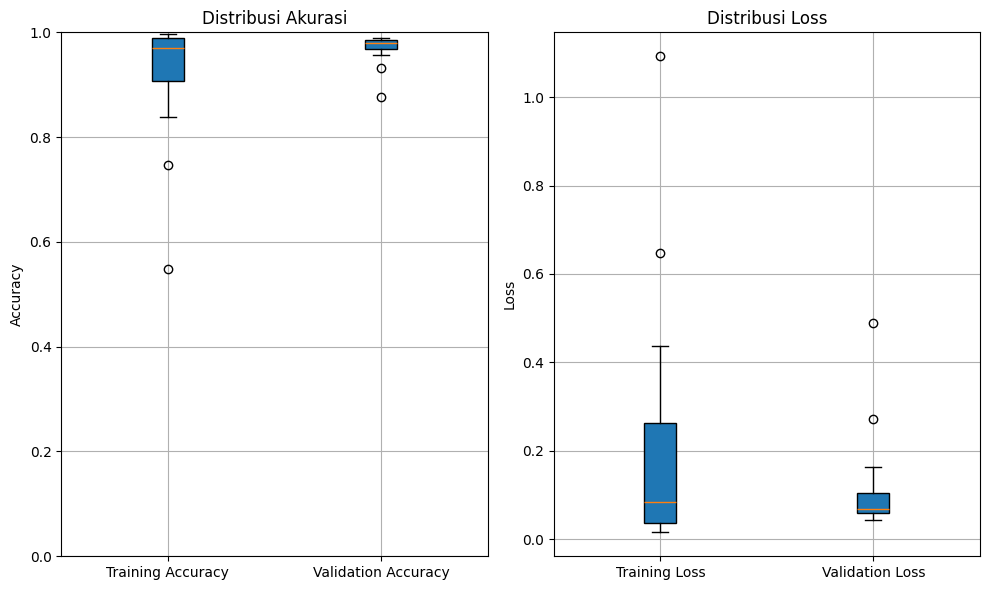


🚀 Training Fold 5 😌

Found 1847 validated image filenames belonging to 4 classes.
Found 461 validated image filenames belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 189s 3s/step - accuracy: 0.4327 - loss: 1.3514 - val_accuracy: 0.8807 - val_loss: 0.4544 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 166s 3s/step - accuracy: 0.7909 - loss: 0.5448 - val_accuracy: 0.9328 - val_loss: 0.2788 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 166s 3s/step - accuracy: 0.8646 - loss: 0.3904 - val_accuracy: 0.9566 - val_loss: 0.1585 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 166s 3s/step - accuracy: 0.8931 - loss: 0.2849 - val_accuracy: 0.9653 - val_loss: 0.1252 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 165s 3s/step - accuracy: 0.9361 - loss: 0.1894 - val_accuracy: 0.9696 - val_loss: 0.0943 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 166s 3s/step - accuracy: 0.9604 - loss: 0.1264 - val_accuracy: 0.9761 - val_loss: 0.0887 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 165s 3s/step - accuracy: 0.9626 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\2190934247.py:123: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_16380\2190934247.py:132: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


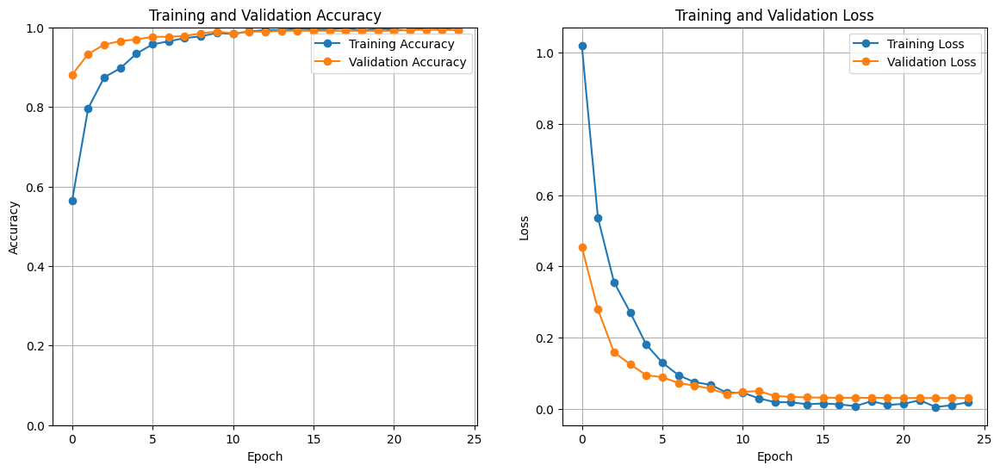

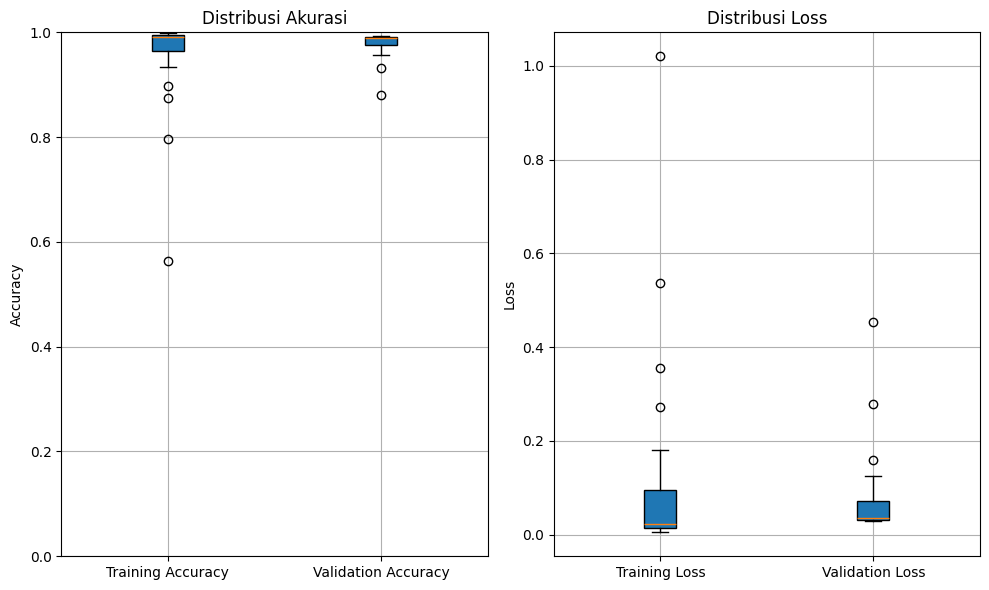

In [24]:
# Implementasi Kfold
EPOCH = 25
kf = KFold(n_splits=5, shuffle=True, random_state=42) # tambahkan random_state untuk reproduksibilitas

# Direktori untuk menyimpan model terbaik
best_model_dir = r'.\keras aug\zoom in\A2' # Mendefinisikan best_model_dir di luar fungsi
# Fungsi untuk membuat model
def create_model(num_classes):
    base_model = DenseNet169(
        weights='imagenet', 
        include_top=False, 
        input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, COLOR_CHANNELS))
    
    # Membekukan 596 layer awal dari DenseNet169
    for layer in base_model.layers[:-10]:  
        layer.trainable = False

    # Custom Layer base model
    x = base_model.output
    x = Conv2D(32, (4, 4), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu', name='FC2')(x) 
    x = Dropout(0.3)(x)
    x = Flatten()(x)
    x = Dropout(0.3)(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(optimizer=RMSprop(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
    
    # model.summary()
    return model

fold_var = 1 # Inisialisasi variabel fold
for train_index, val_index in kf.split(file_paths):
    print(f"\n🚀 Training Fold {fold_var} 😌\n")

    # Split train and validation sets
    train_files, val_files = np.array(file_paths)[train_index], np.array(file_paths)[val_index]
    train_labels, val_labels = np.array(integer_labels)[train_index], np.array(integer_labels)[val_index]
    
    # Convert integer labels to class names
    df_train = pd.DataFrame({"filename": train_files, "class": [unique_labels[i] for i in train_labels]})
    df_val = pd.DataFrame({"filename": val_files, "class": [unique_labels[i] for i in val_labels]})

    train_generator = datagen.flow_from_dataframe(
        dataframe=df_train,       # DataFrame yang berisi informasi gambar (filename dan class)
        x_col="filename",         # Kolom yang berisi path ke gambar
        y_col="class",            # Kolom yang berisi label kelas gambar
        target_size=IMAGE_SIZE,   # Ukuran gambar yang akan diubah sebelum masuk ke model
        batch_size=BATCH_SIZE,    # Jumlah gambar yang akan diproses dalam satu batch
        class_mode="categorical", # Mode klasifikasi (multikategori)
        color_mode="rgb",         # Format warna gambar (RGB)
        shuffle=True
    )
    
    val_generator = datagen.flow_from_dataframe(
        dataframe=df_val,
        x_col="filename",
        y_col="class",
        target_size=IMAGE_SIZE,
        batch_size=BATCH_SIZE,
        class_mode="categorical",
        color_mode="rgb",
        shuffle=True
    )

    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)
    model_checkpoint = ModelCheckpoint(os.path.join(best_model_dir, f'zoom_model_{fold_var}.keras'), monitor='val_loss', save_best_only=True)
    
    # Buat Learning Rate Scheduler
    lr_scheduler = ReduceLROnPlateau(
        monitor='val_accuracy',     
        factor=0.1,             
        patience=3,             # Jika val_loss tidak membaik setelah 3 epoch, LR akan diturunkan
        min_lr=1e-6,            
        verbose=1               
    )

    num_classes = 4 
    model = create_model(num_classes)

    # Training Model
    history = model.fit(
        train_generator,
        epochs=EPOCH,
        validation_data=val_generator,
        callbacks=[early_stopping, model_checkpoint, lr_scheduler]
    )

    # Plot grafik akurasi dan loss dengan format yang lebih baik
    plt.figure(figsize=(14, 6))

    # Plot Training and Validation Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1)  # Menentukan rentang y antara 0 dan 1 (untuk akurasi)
    plt.grid(True)
    plt.legend()

    # Plot Training and Validation Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.legend()

    # Buat figure Box Plot
    plt.figure(figsize=(10, 6))
    
    # Boxplot untuk Training & Validation Accuracy
    plt.subplot(1, 2, 1)
    plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
                labels=['Training Accuracy', 'Validation Accuracy'])
    plt.title('Distribusi Akurasi')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1)
    plt.grid(True)
    
    # Boxplot untuk Training & Validation Loss
    plt.subplot(1, 2, 2)
    plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,
                labels=['Training Loss', 'Validation Loss'])
    plt.title('Distribusi Loss')
    plt.ylabel('Loss')
    plt.grid(True)

    # Tampilkan grafik
    plt.tight_layout()
    plt.show()

    fold_var += 1

In [1]:
import numpy as np

# Contoh hasil akurasi dari 5 fold
accuracies = [98.70, 97.19, 97.62, 98.70, 99.35]

# Menghitung standar deviasi
std_dev = np.std(accuracies)

print(f"Standar Deviasi Akurasi Model P2: {std_dev:.4f}")

Standar Deviasi Akurasi Model P2: 0.7895


In [6]:
test_dir = r'..\..\dataset\Batik Djawa\test'

datagen = ImageDataGenerator(
    preprocessing_function=preprocess_image
    )

test_generator = datagen.flow_from_directory(
    directory=test_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False
)

Found 292 images belonging to 4 classes.





Kfold 1 ...


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step


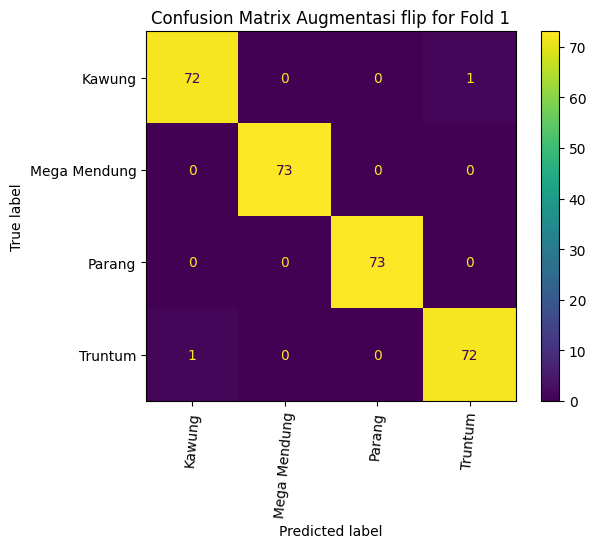

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9863    0.9863    0.9863        73
Mega Mendung     1.0000    1.0000    1.0000        73
      Parang     1.0000    1.0000    1.0000        73
     Truntum     0.9863    0.9863    0.9863        73

    accuracy                         0.9932       292
   macro avg     0.9932    0.9932    0.9932       292
weighted avg     0.9932    0.9932    0.9932       292




Kfold 2 ...
10/10 ━━━━━━━━━━━━━━━━━━━━ 33s 3s/step


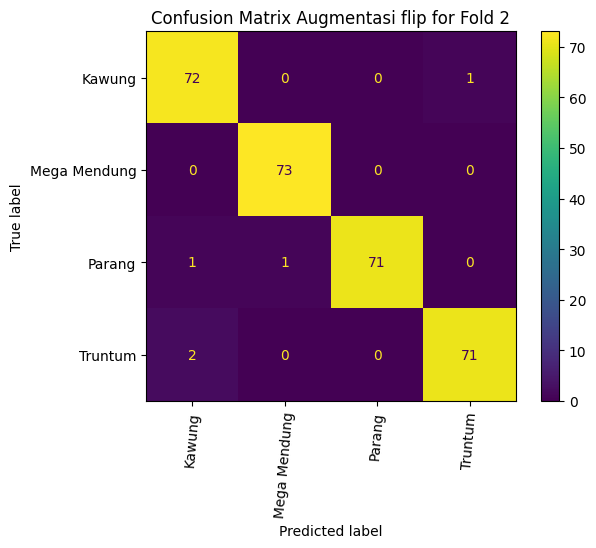

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9600    0.9863    0.9730        73
Mega Mendung     0.9865    1.0000    0.9932        73
      Parang     1.0000    0.9726    0.9861        73
     Truntum     0.9861    0.9726    0.9793        73

    accuracy                         0.9829       292
   macro avg     0.9831    0.9829    0.9829       292
weighted avg     0.9831    0.9829    0.9829       292




Kfold 3 ...
10/10 ━━━━━━━━━━━━━━━━━━━━ 31s 3s/step


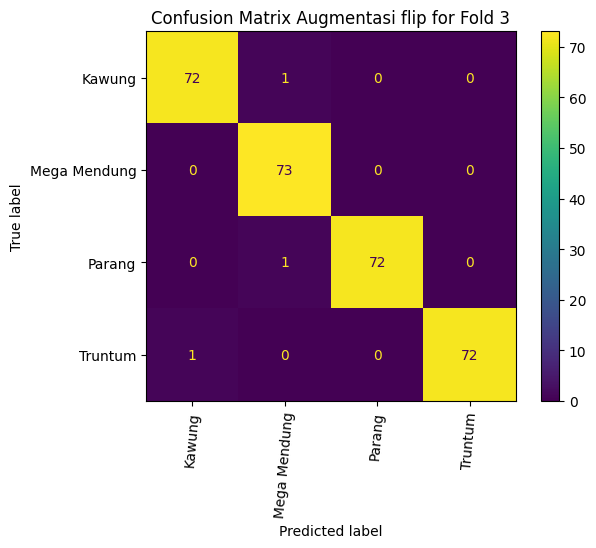

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9863    0.9863    0.9863        73
Mega Mendung     0.9733    1.0000    0.9865        73
      Parang     1.0000    0.9863    0.9931        73
     Truntum     1.0000    0.9863    0.9931        73

    accuracy                         0.9897       292
   macro avg     0.9899    0.9897    0.9897       292
weighted avg     0.9899    0.9897    0.9897       292




Kfold 4 ...
10/10 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step


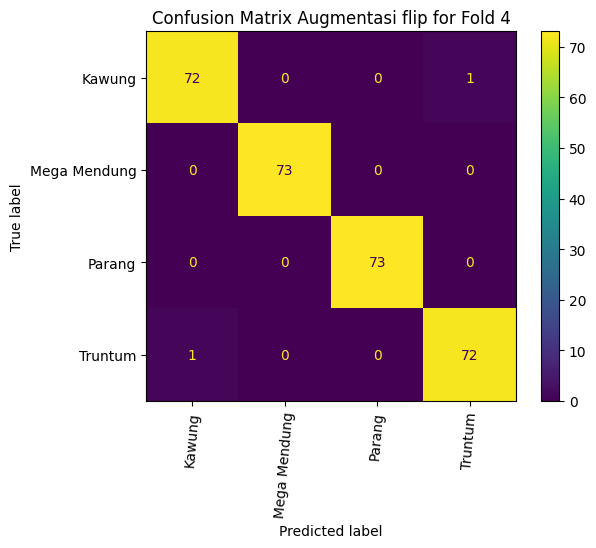

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9863    0.9863    0.9863        73
Mega Mendung     1.0000    1.0000    1.0000        73
      Parang     1.0000    1.0000    1.0000        73
     Truntum     0.9863    0.9863    0.9863        73

    accuracy                         0.9932       292
   macro avg     0.9932    0.9932    0.9932       292
weighted avg     0.9932    0.9932    0.9932       292




Kfold 5 ...
10/10 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step


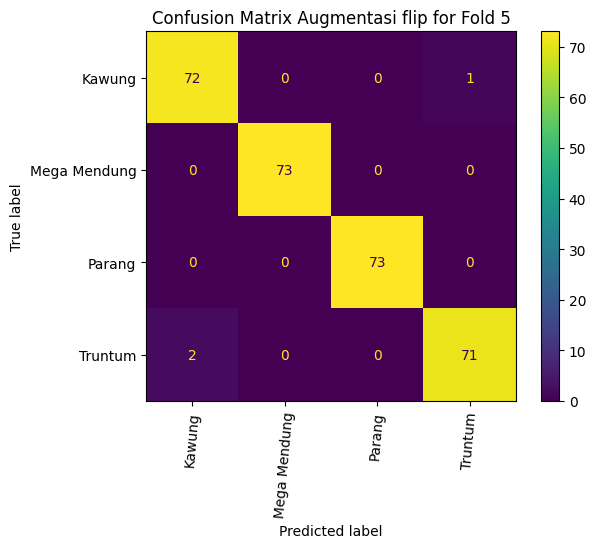

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9730    0.9863    0.9796        73
Mega Mendung     1.0000    1.0000    1.0000        73
      Parang     1.0000    1.0000    1.0000        73
     Truntum     0.9861    0.9726    0.9793        73

    accuracy                         0.9897       292
   macro avg     0.9898    0.9897    0.9897       292
weighted avg     0.9898    0.9897    0.9897       292



In [7]:
def evaluate_model(fold_count, test_generator, model_path='./keras aug/zoom in/A2/zoom_model_'):
    for fold in range(1, fold_count + 1):
        print('\n\n')
        print(f"Kfold {fold} ...")
        loaded_model = load_model(f'{model_path}{fold}.keras')
        
        predictions = loaded_model.predict(test_generator)
        
        # Get class labels
        class_labels = list(test_generator.class_indices.keys())
        
        # Get the true and predicted class indices
        y_true = test_generator.classes
        y_pred = np.argmax(predictions, axis=1)
        
        # Confusion Matrix Display
        conf_matrix = confusion_matrix(y_true, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_labels)
        
        disp.plot(cmap='viridis')
        plt.title(f'Confusion Matrix Augmentasi flip for Fold {fold}')
        plt.xticks(rotation=85)
        plt.show()
        
        class_report = classification_report(y_true, y_pred, target_names=class_labels, digits=4)
        print('Classification Report')
        print(class_report)

evaluate_model(fold_count=5, test_generator=test_generator)

## 150 layer

In [ ]:
def create_model(num_classes):
    base_model = DenseNet169(weights='imagenet', include_top=False, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, COLOR_CHANNELS))

    for layer in base_model.layers[:-150]:
        layer.trainable = False

    x = base_model.output
    x = Conv2D(32, (4, 4), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu', name='FC2')(x) 
    x = Dropout(0.3)(x)
    x = Flatten()(x)
    x = Dropout(0.3)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer=RMSprop(0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

    print("Total jumlah layer:", len(model.layers))

    print("Total trainable layers:", len([layer for layer in model.layers if layer.trainable]))
    model.summary()
    return model

# Direktori untuk menyimpan model terbaik
best_model_dir = r'.\keras' # Mendefinisikan best_model_dir di luar fungsi
os.makedirs(best_model_dir, exist_ok=True)

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)
model_checkpoint = ModelCheckpoint(os.path.join(best_model_dir, 'conv5_coba_lagi.keras'), monitor='val_loss', save_best_only=True)

# Buat Learning Rate Scheduler
lr_scheduler = ReduceLROnPlateau(
    monitor='val_accuracy',     
    factor=0.1,             
    patience=3,             # Jika val_loss tidak membaik setelah 3 epoch, LR akan diturunkan
    min_lr=1e-6,            
    verbose=1               
)

num_classes = 4 # atau bagaimanapun Anda menentukan jumlah kelas
model = create_model(num_classes) # Panggil fungsi create_model dengan jumlah kelas yang benar

train_generator = datagen.flow_from_directory(
    directory=train_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

val_generator = datagen.flow_from_directory(
    directory=train_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=True
)

# Training model tanpa KFold
EPOCHS = 20  # Ubah jumlah epoch menjadi 10
history = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    callbacks=[early_stopping, model_checkpoint, lr_scheduler]
)

# Plot grafik akurasi dan loss dengan format yang lebih baik
plt.figure(figsize=(14, 6))

# Plot Training and Validation Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Menentukan rentang y antara 0 dan 1 (untuk akurasi)
plt.grid(True)
plt.legend()

# Plot Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss', marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()

# Buat figure Box Plot
plt.figure(figsize=(10, 6))

# Boxplot untuk Training & Validation Accuracy
plt.subplot(1, 2, 1)
plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
            labels=['Training Accuracy', 'Validation Accuracy'])
plt.title('Distribusi Akurasi')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.grid(True)

# Boxplot untuk Training & Validation Loss
plt.subplot(1, 2, 2)
plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,
            labels=['Training Loss', 'Validation Loss'])
plt.title('Distribusi Loss')
plt.ylabel('Loss')
plt.grid(True)

# Tampilkan grafik
plt.tight_layout()
plt.show()

Total jumlah layer: 603
Total trainable layers: 158


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_3… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 13,498,020 (51.49 MB)

 Trainable params: 5,219,748 (19.91 MB)

 Non-trainable params: 8,278,272 (31.58 MB)

Found 2308 images belonging to 4 classes.
Found 0 images belonging to 4 classes.
Epoch 1/20


KeyboardInterrupt: 


🚀 Training Fold 1 😌

Found 1846 validated image filenames belonging to 4 classes.
Found 462 validated image filenames belonging to 4 classes.
Total jumlah layer: 603
Total trainable layers: 158


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 256s 4s/step - accuracy: 0.5211 - loss: 1.1782 - val_accuracy: 0.9177 - val_loss: 0.2972 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 188s 3s/step - accuracy: 0.8360 - loss: 0.4239 - val_accuracy: 0.9632 - val_loss: 0.1317 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 188s 3s/step - accuracy: 0.9028 - loss: 0.2692 - val_accuracy: 0.9697 - val_loss: 0.0819 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 188s 3s/step - accuracy: 0.9450 - loss: 0.1429 - val_accuracy: 0.9848 - val_loss: 0.0644 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 186s 3s/step - accuracy: 0.9669 - loss: 0.1048 - val_accuracy: 0.9848 - val_loss: 0.0784 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 186s 3s/step - accuracy: 0.9786 - loss: 0.0682 - val_accuracy: 0.9740 - val_loss: 0.0872 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 178s 3s/step - accuracy: 0.9824 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_18852\1158989539.py:126: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_18852\1158989539.py:135: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


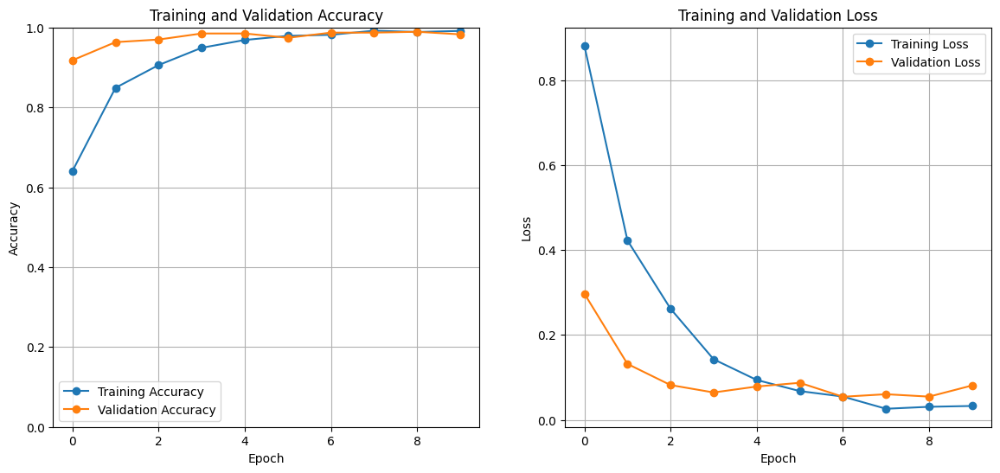

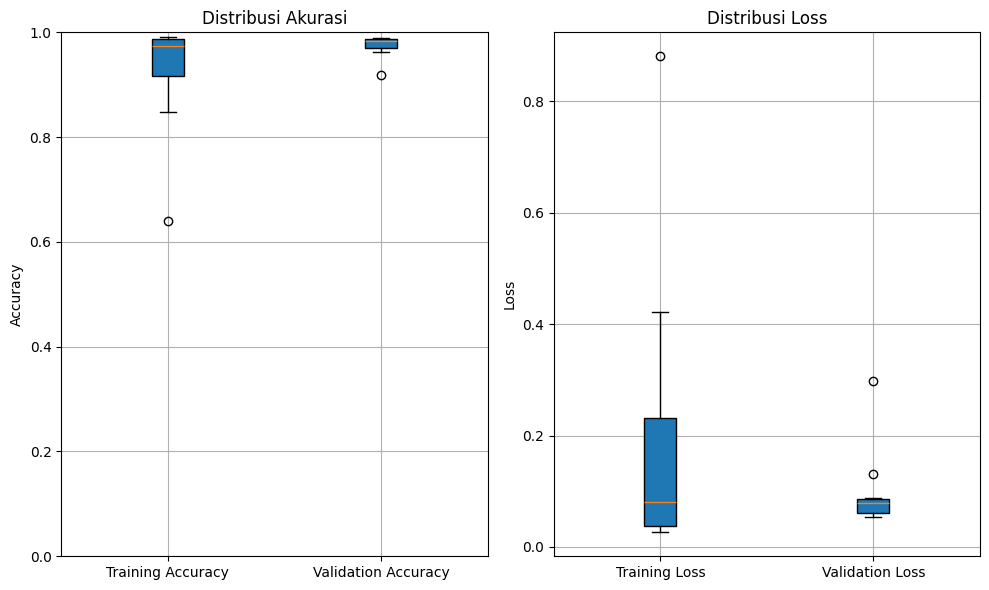


🚀 Training Fold 2 😌

Found 1846 validated image filenames belonging to 4 classes.
Found 462 validated image filenames belonging to 4 classes.
Total jumlah layer: 603
Total trainable layers: 158


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 236s 4s/step - accuracy: 0.4302 - loss: 1.3604 - val_accuracy: 0.9242 - val_loss: 0.3909 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 197s 3s/step - accuracy: 0.7780 - loss: 0.5556 - val_accuracy: 0.9502 - val_loss: 0.1614 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 195s 3s/step - accuracy: 0.8848 - loss: 0.3030 - val_accuracy: 0.9697 - val_loss: 0.1042 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 194s 3s/step - accuracy: 0.9251 - loss: 0.1972 - val_accuracy: 0.9697 - val_loss: 0.0847 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 190s 3s/step - accuracy: 0.9498 - loss: 0.1412 - val_accuracy: 0.9697 - val_loss: 0.1004 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9667 - loss: 0.0890
Epoch 6: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
58/58 ━━━━━━━━━━━━━━━━━━━━ 191s 3s/step - accuracy: 0.9667 - loss:

C:\Users\ASUS\AppData\Local\Temp\ipykernel_18852\1158989539.py:126: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_18852\1158989539.py:135: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


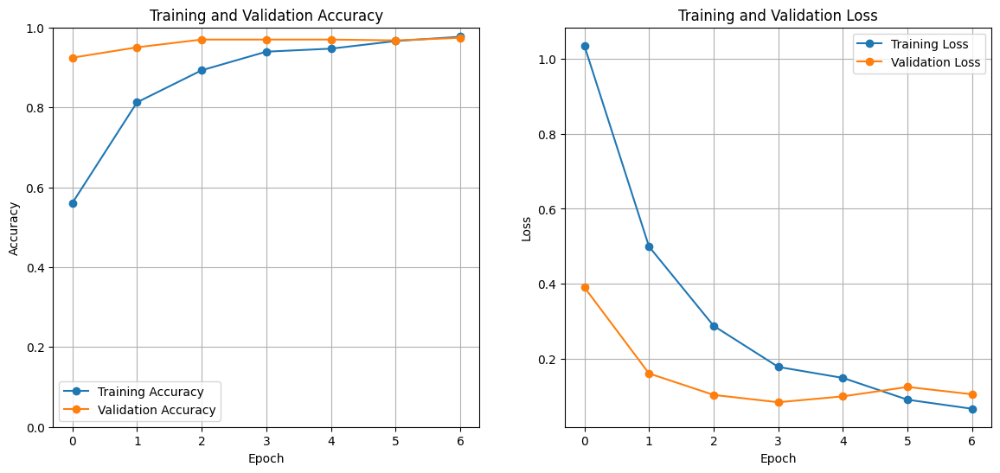

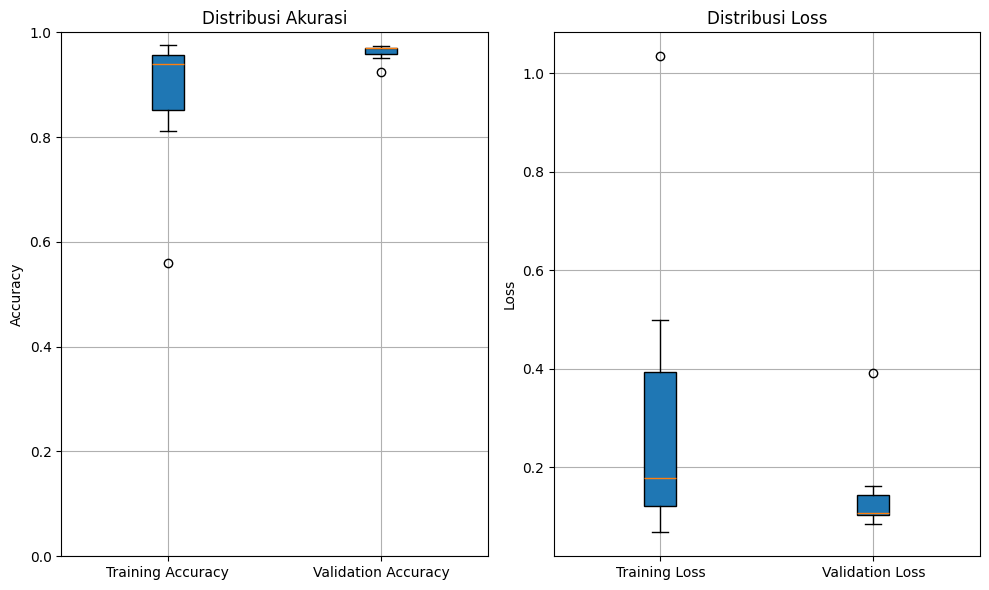


🚀 Training Fold 3 😌

Found 1846 validated image filenames belonging to 4 classes.
Found 462 validated image filenames belonging to 4 classes.
Total jumlah layer: 603
Total trainable layers: 158


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 237s 4s/step - accuracy: 0.5620 - loss: 1.1409 - val_accuracy: 0.9459 - val_loss: 0.2371 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 194s 3s/step - accuracy: 0.8445 - loss: 0.3908 - val_accuracy: 0.9589 - val_loss: 0.1364 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 202s 3s/step - accuracy: 0.9216 - loss: 0.2148 - val_accuracy: 0.9697 - val_loss: 0.1037 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 193s 3s/step - accuracy: 0.9589 - loss: 0.1282 - val_accuracy: 0.9762 - val_loss: 0.0674 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 191s 3s/step - accuracy: 0.9734 - loss: 0.0766 - val_accuracy: 0.9762 - val_loss: 0.0762 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 189s 3s/step - accuracy: 0.9809 - loss: 0.0541 - val_accuracy: 0.9805 - val_loss: 0.0646 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 187s 3s/step - accuracy: 0.9798 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_18852\1158989539.py:126: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_18852\1158989539.py:135: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


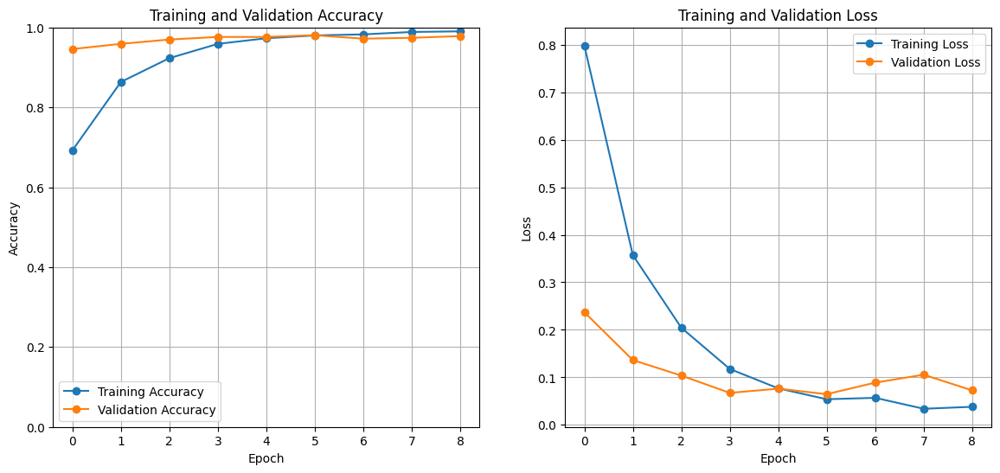

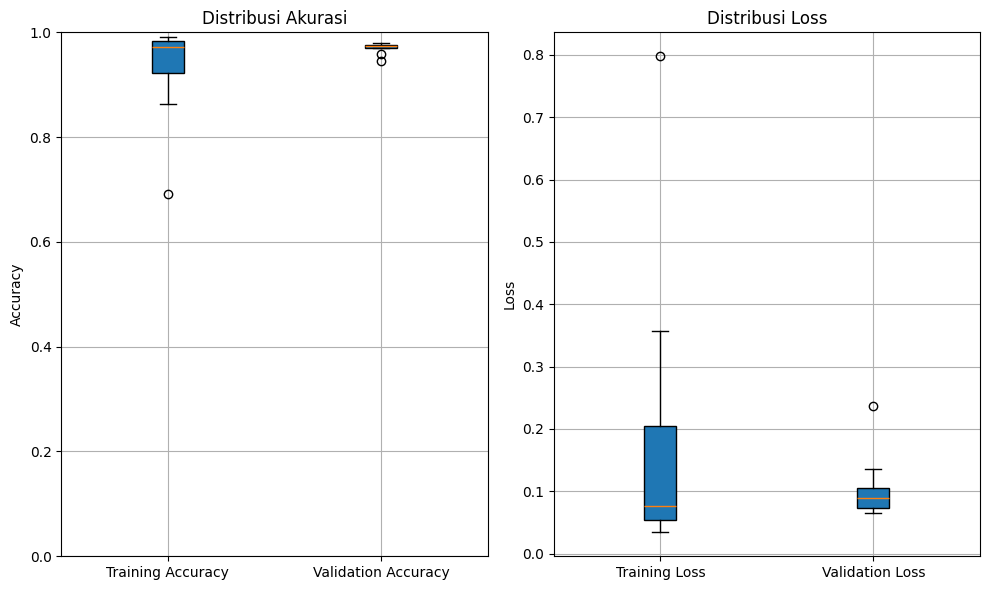


🚀 Training Fold 4 😌

Found 1847 validated image filenames belonging to 4 classes.
Found 461 validated image filenames belonging to 4 classes.
Total jumlah layer: 603
Total trainable layers: 158


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 215s 3s/step - accuracy: 0.5094 - loss: 1.3477 - val_accuracy: 0.8959 - val_loss: 0.4021 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 183s 3s/step - accuracy: 0.8205 - loss: 0.4794 - val_accuracy: 0.9631 - val_loss: 0.1480 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 183s 3s/step - accuracy: 0.8931 - loss: 0.3063 - val_accuracy: 0.9588 - val_loss: 0.0912 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 183s 3s/step - accuracy: 0.9511 - loss: 0.1421 - val_accuracy: 0.9740 - val_loss: 0.0616 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 183s 3s/step - accuracy: 0.9577 - loss: 0.1110 - val_accuracy: 0.9826 - val_loss: 0.0722 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 184s 3s/step - accuracy: 0.9735 - loss: 0.0877 - val_accuracy: 0.9848 - val_loss: 0.0389 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 182s 3s/step - accuracy: 0.9772 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_18852\1158989539.py:126: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_18852\1158989539.py:135: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


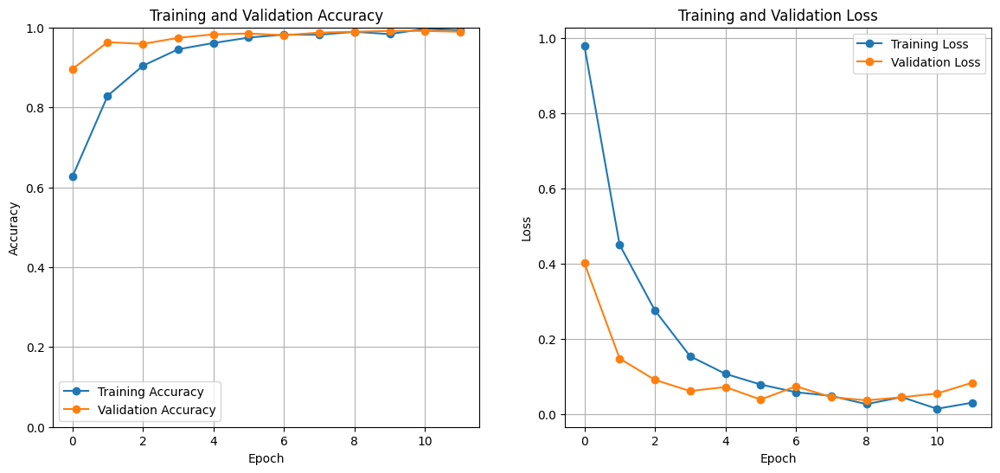

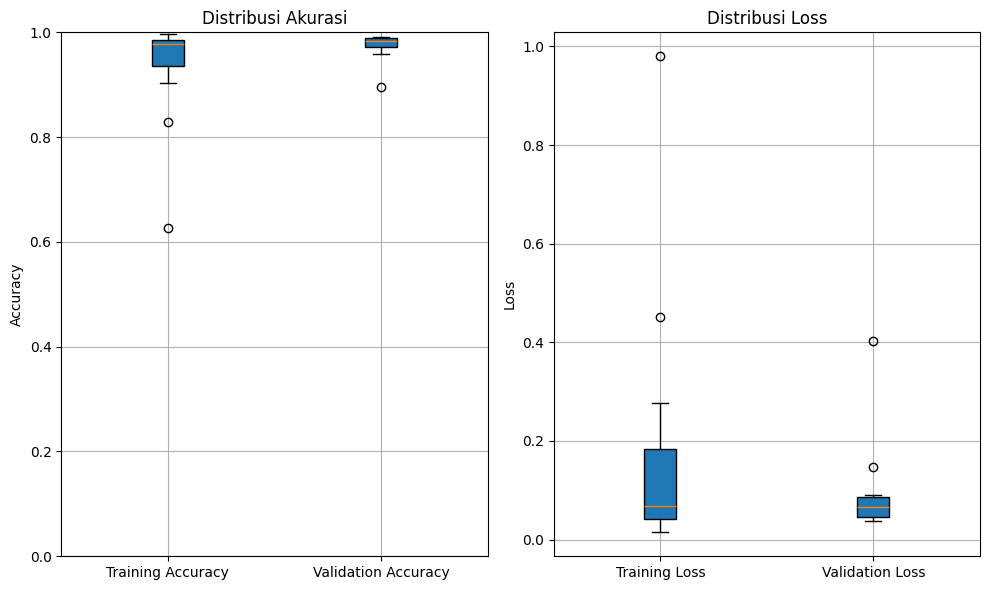


🚀 Training Fold 5 😌

Found 1847 validated image filenames belonging to 4 classes.
Found 461 validated image filenames belonging to 4 classes.
Total jumlah layer: 603
Total trainable layers: 158


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 222s 3s/step - accuracy: 0.4877 - loss: 1.2863 - val_accuracy: 0.8764 - val_loss: 0.4036 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 187s 3s/step - accuracy: 0.7677 - loss: 0.6044 - val_accuracy: 0.9479 - val_loss: 0.1544 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 186s 3s/step - accuracy: 0.8861 - loss: 0.3056 - val_accuracy: 0.9740 - val_loss: 0.1046 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 185s 3s/step - accuracy: 0.9313 - loss: 0.1902 - val_accuracy: 0.9740 - val_loss: 0.0591 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 188s 3s/step - accuracy: 0.9623 - loss: 0.1153 - val_accuracy: 0.9848 - val_loss: 0.0443 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 183s 3s/step - accuracy: 0.9589 - loss: 0.0937 - val_accuracy: 0.9805 - val_loss: 0.0476 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 186s 3s/step - accuracy: 0.9728 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_18852\1158989539.py:126: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_18852\1158989539.py:135: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


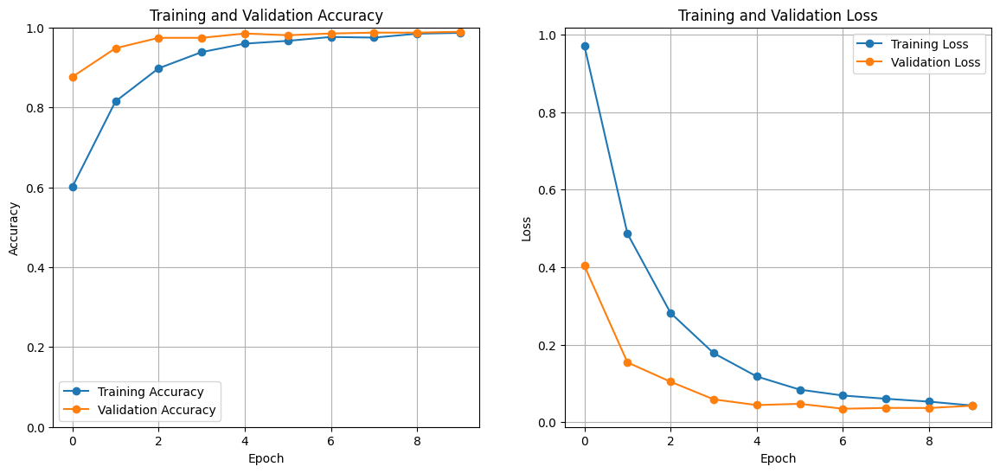

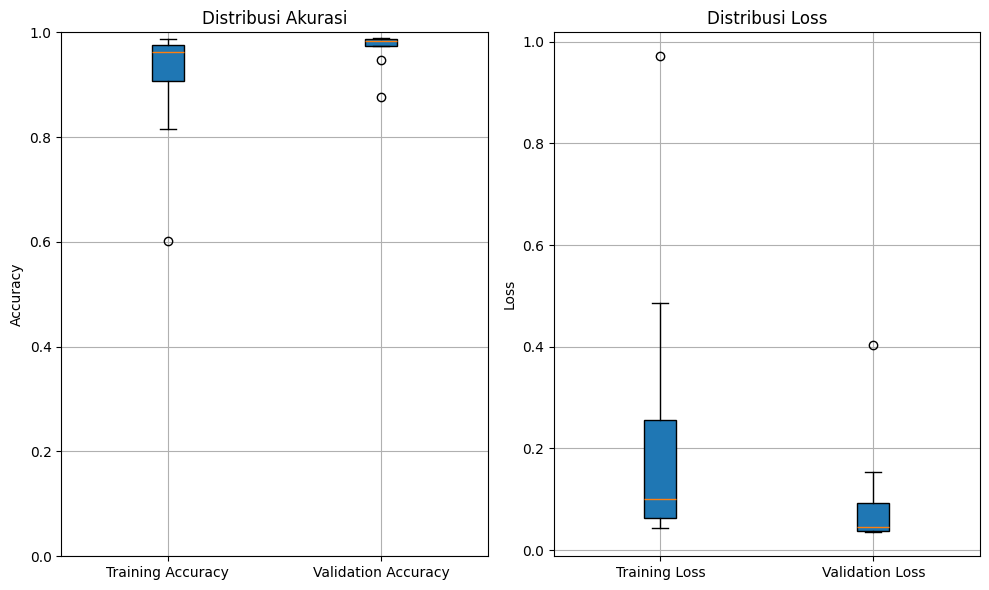

In [11]:
# Implementasi Kfold
EPOCH = 25
kf = KFold(n_splits=5, shuffle=True, random_state=42) # tambahkan random_state untuk reproduksibilitas

# Direktori untuk menyimpan model terbaik
best_model_dir = r'.\keras aug\zoom in\A2' # Mendefinisikan best_model_dir di luar fungsi
# Fungsi untuk membuat model
def create_model(num_classes):
    base_model = DenseNet169(
        weights='imagenet', 
        include_top=False, 
        input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, COLOR_CHANNELS))
    
    # Membekukan 445 layer awal dari DenseNet169
    for layer in base_model.layers[:-150]:  
        layer.trainable = False

    # Custom Layer base model
    x = base_model.output
    x = Conv2D(32, (4, 4), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu', name='FC2')(x) 
    x = Dropout(0.3)(x)
    x = Flatten()(x)
    x = Dropout(0.3)(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(optimizer=RMSprop(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
    
    print("Total jumlah layer:", len(model.layers))

    print("Total trainable layers:", len([layer for layer in model.layers if layer.trainable]))
    # model.summary()
    return model

fold_var = 1 # Inisialisasi variabel fold
for train_index, val_index in kf.split(file_paths):
    print(f"\n🚀 Training Fold {fold_var} 😌\n")

    # Split train and validation sets
    train_files, val_files = np.array(file_paths)[train_index], np.array(file_paths)[val_index]
    train_labels, val_labels = np.array(integer_labels)[train_index], np.array(integer_labels)[val_index]
    
    # Convert integer labels to class names
    df_train = pd.DataFrame({"filename": train_files, "class": [unique_labels[i] for i in train_labels]})
    df_val = pd.DataFrame({"filename": val_files, "class": [unique_labels[i] for i in val_labels]})

    train_generator = datagen.flow_from_dataframe(
        dataframe=df_train,       # DataFrame yang berisi informasi gambar (filename dan class)
        x_col="filename",         # Kolom yang berisi path ke gambar
        y_col="class",            # Kolom yang berisi label kelas gambar
        target_size=IMAGE_SIZE,   # Ukuran gambar yang akan diubah sebelum masuk ke model
        batch_size=BATCH_SIZE,    # Jumlah gambar yang akan diproses dalam satu batch
        class_mode="categorical", # Mode klasifikasi (multikategori)
        color_mode="rgb",         # Format warna gambar (RGB)
        shuffle=True
    )
    
    val_generator = datagen.flow_from_dataframe(
        dataframe=df_val,
        x_col="filename",
        y_col="class",
        target_size=IMAGE_SIZE,
        batch_size=BATCH_SIZE,
        class_mode="categorical",
        color_mode="rgb",
        shuffle=True
    )

    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)
    model_checkpoint = ModelCheckpoint(os.path.join(best_model_dir, f'150_model_{fold_var}.keras'), monitor='val_loss', save_best_only=True)
    
    # Buat Learning Rate Scheduler
    lr_scheduler = ReduceLROnPlateau(
        monitor='val_accuracy',     
        factor=0.1,             
        patience=3,             # Jika val_loss tidak membaik setelah 3 epoch, LR akan diturunkan
        min_lr=1e-6,            
        verbose=1               
    )

    num_classes = 4 
    model = create_model(num_classes)

    # Training Model
    history = model.fit(
        train_generator,
        epochs=EPOCH,
        validation_data=val_generator,
        callbacks=[early_stopping, model_checkpoint, lr_scheduler]
    )

    # Plot grafik akurasi dan loss dengan format yang lebih baik
    plt.figure(figsize=(14, 6))

    # Plot Training and Validation Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1)  # Menentukan rentang y antara 0 dan 1 (untuk akurasi)
    plt.grid(True)
    plt.legend()

    # Plot Training and Validation Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.legend()

    # Buat figure Box Plot
    plt.figure(figsize=(10, 6))
    
    # Boxplot untuk Training & Validation Accuracy
    plt.subplot(1, 2, 1)
    plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
                labels=['Training Accuracy', 'Validation Accuracy'])
    plt.title('Distribusi Akurasi')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1)
    plt.grid(True)
    
    # Boxplot untuk Training & Validation Loss
    plt.subplot(1, 2, 2)
    plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,
                labels=['Training Loss', 'Validation Loss'])
    plt.title('Distribusi Loss')
    plt.ylabel('Loss')
    plt.grid(True)

    # Tampilkan grafik
    plt.tight_layout()
    plt.show()

    fold_var += 1

In [1]:
import numpy as np

# Contoh hasil akurasi dari 5 fold
accuracies = [98.70, 96.97, 98.05, 98.92, 98.48]

# Menghitung standar deviasi
std_dev = np.std(accuracies)

print(f"Standar Deviasi Akurasi Model P2: {std_dev:.4f}")

Standar Deviasi Akurasi Model P2: 0.6898


## preprocessing CLAHE + RGB




Kfold 1 ...


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 53s 3s/step


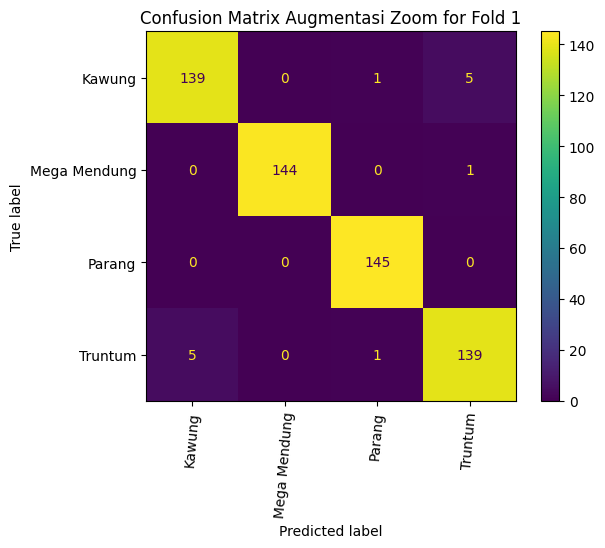

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9653    0.9586    0.9619       145
Mega Mendung     1.0000    0.9931    0.9965       145
      Parang     0.9864    1.0000    0.9932       145
     Truntum     0.9586    0.9586    0.9586       145

    accuracy                         0.9776       580
   macro avg     0.9776    0.9776    0.9776       580
weighted avg     0.9776    0.9776    0.9776       580




Kfold 2 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step


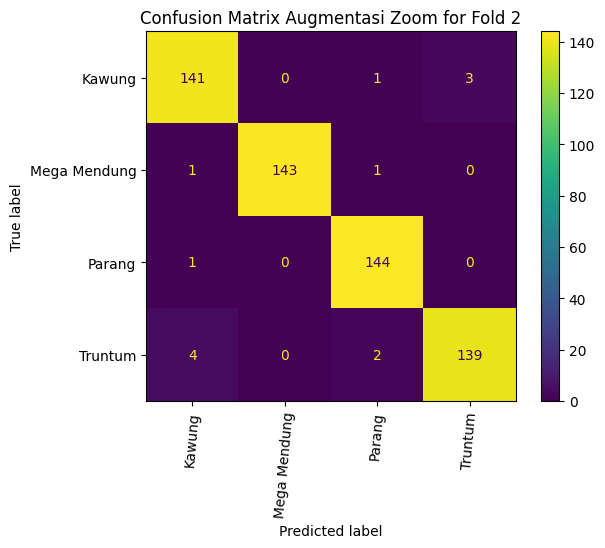

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9592    0.9724    0.9658       145
Mega Mendung     1.0000    0.9862    0.9931       145
      Parang     0.9730    0.9931    0.9829       145
     Truntum     0.9789    0.9586    0.9686       145

    accuracy                         0.9776       580
   macro avg     0.9778    0.9776    0.9776       580
weighted avg     0.9778    0.9776    0.9776       580




Kfold 3 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 53s 3s/step


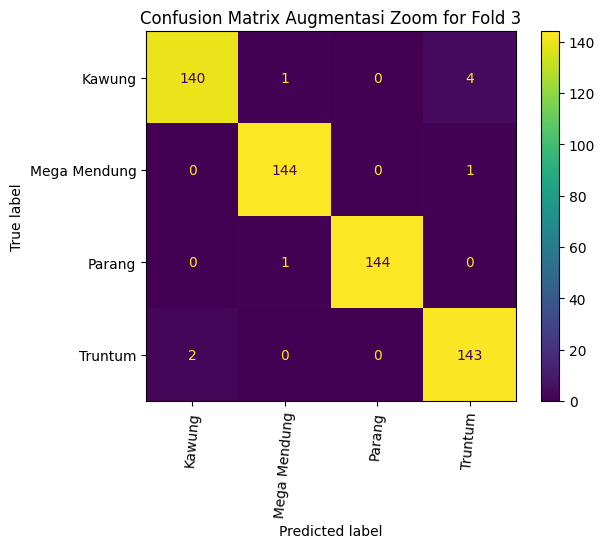

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9859    0.9655    0.9756       145
Mega Mendung     0.9863    0.9931    0.9897       145
      Parang     1.0000    0.9931    0.9965       145
     Truntum     0.9662    0.9862    0.9761       145

    accuracy                         0.9845       580
   macro avg     0.9846    0.9845    0.9845       580
weighted avg     0.9846    0.9845    0.9845       580




Kfold 4 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 59s 3s/step


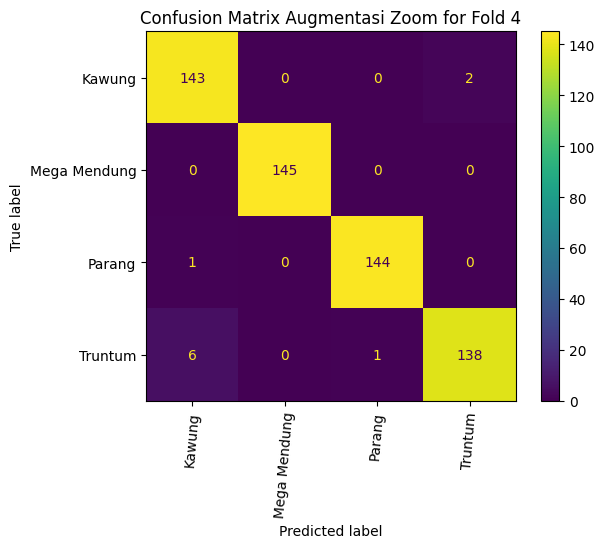

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9533    0.9862    0.9695       145
Mega Mendung     1.0000    1.0000    1.0000       145
      Parang     0.9931    0.9931    0.9931       145
     Truntum     0.9857    0.9517    0.9684       145

    accuracy                         0.9828       580
   macro avg     0.9830    0.9828    0.9828       580
weighted avg     0.9830    0.9828    0.9828       580




Kfold 5 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 61s 3s/step


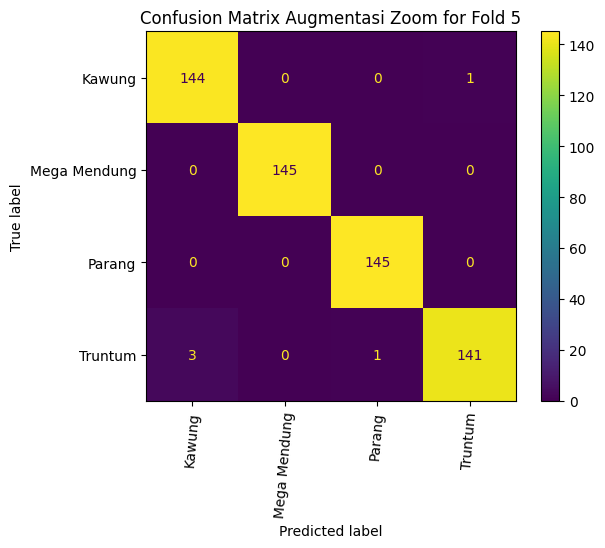

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9796    0.9931    0.9863       145
Mega Mendung     1.0000    1.0000    1.0000       145
      Parang     0.9932    1.0000    0.9966       145
     Truntum     0.9930    0.9724    0.9826       145

    accuracy                         0.9914       580
   macro avg     0.9914    0.9914    0.9914       580
weighted avg     0.9914    0.9914    0.9914       580



In [7]:
def evaluate_model(fold_count, test_generator, model_path='./keras aug/zoom in/A2/zoom_model_'):
    for fold in range(1, fold_count + 1):
        print('\n\n')
        print(f"Kfold {fold} ...")
        loaded_model = load_model(f'{model_path}{fold}.keras')
        
        predictions = loaded_model.predict(test_generator)
        
        # Get class labels
        class_labels = list(test_generator.class_indices.keys())
        
        # Get the true and predicted class indices
        y_true = test_generator.classes
        y_pred = np.argmax(predictions, axis=1)
        
        # Confusion Matrix Display
        conf_matrix = confusion_matrix(y_true, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_labels)
        
        disp.plot(cmap='viridis')
        plt.title(f'Confusion Matrix Augmentasi Zoom for Fold {fold}')
        plt.xticks(rotation=85)
        plt.show()
        
        class_report = classification_report(y_true, y_pred, target_names=class_labels, digits=4)
        print('Classification Report')
        print(class_report)

evaluate_model(fold_count=5, test_generator=test_generator)




Evaluasi KFold 1 ...


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 56s 3s/step
Skor AUC (macro-average) untuk Fold 1: 0.9977


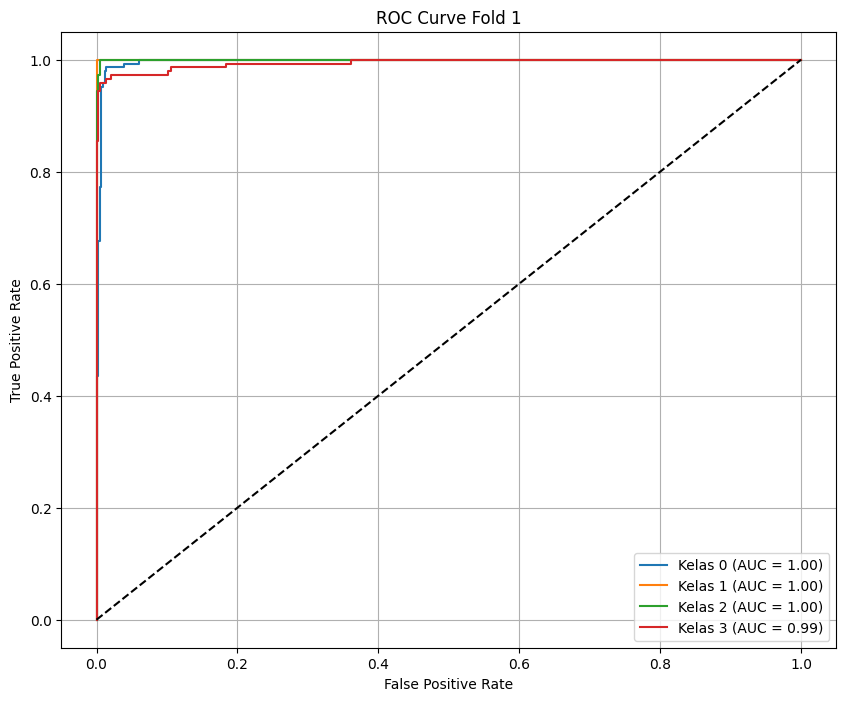




Evaluasi KFold 2 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 55s 3s/step
Skor AUC (macro-average) untuk Fold 2: 0.9981


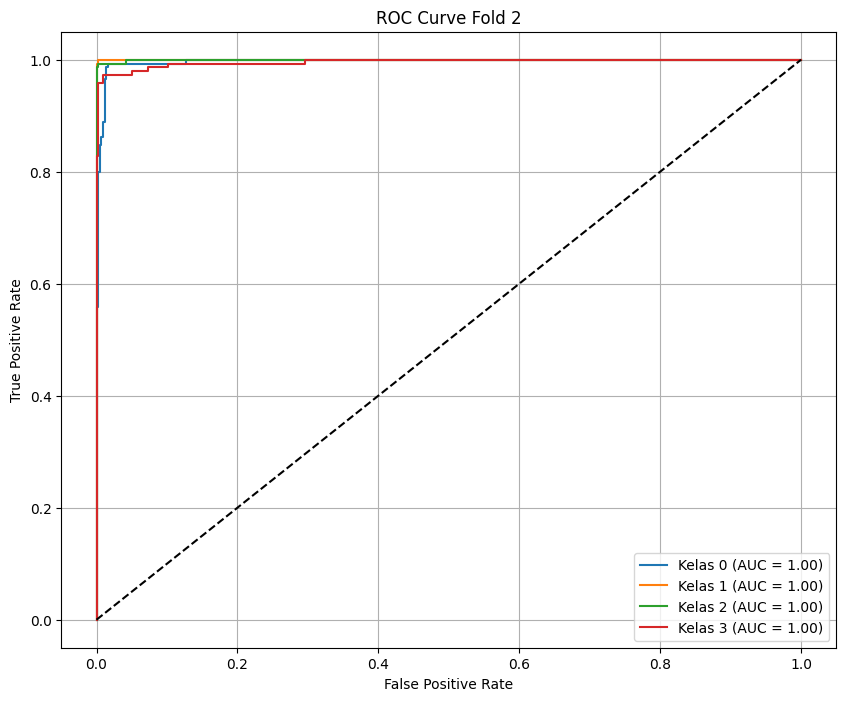




Evaluasi KFold 3 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 59s 3s/step
Skor AUC (macro-average) untuk Fold 3: 0.9985


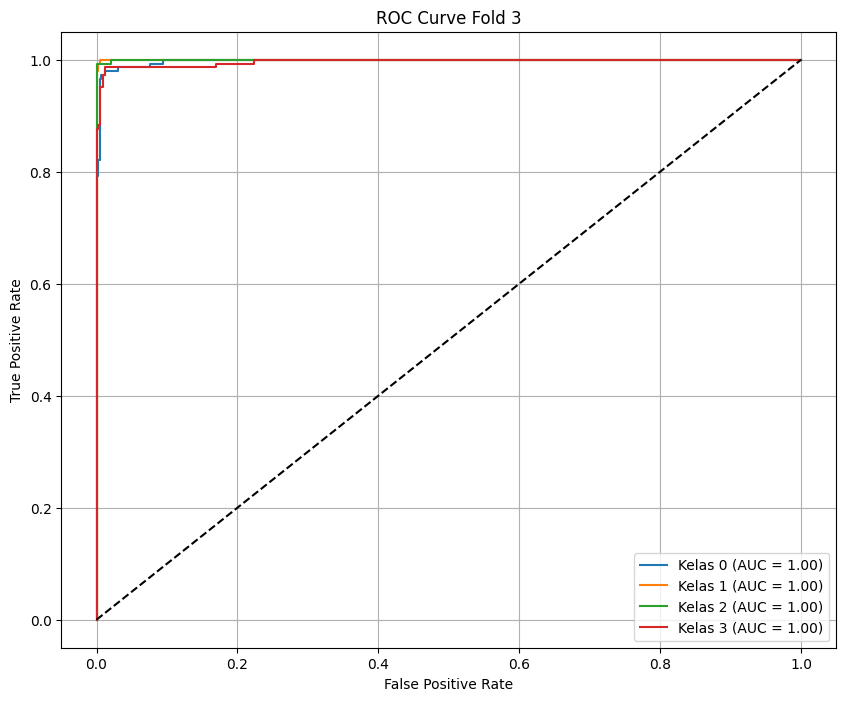




Evaluasi KFold 4 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 58s 3s/step
Skor AUC (macro-average) untuk Fold 4: 0.9987


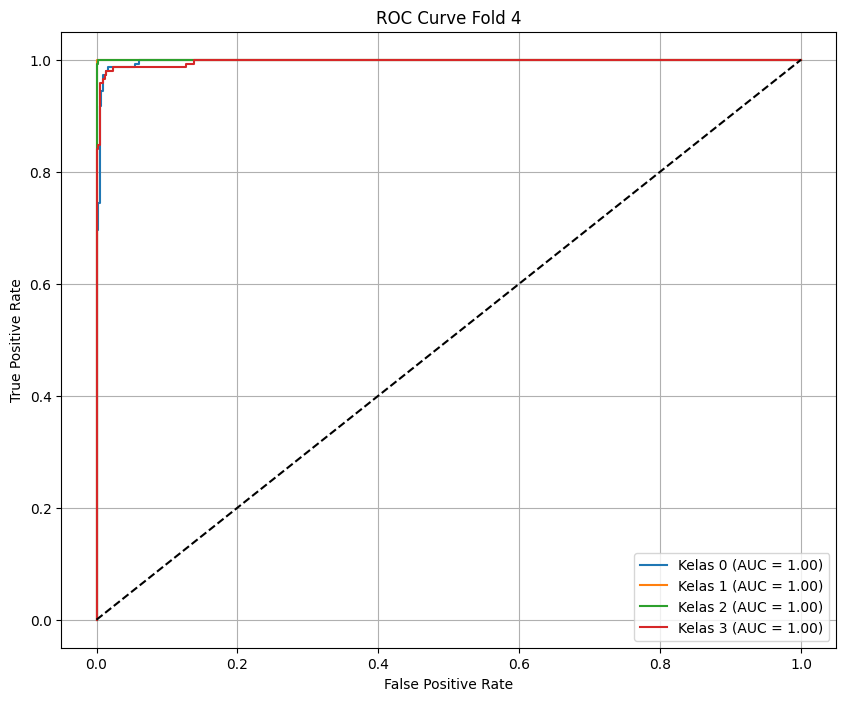




Evaluasi KFold 5 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 59s 3s/step
Skor AUC (macro-average) untuk Fold 5: 0.9994


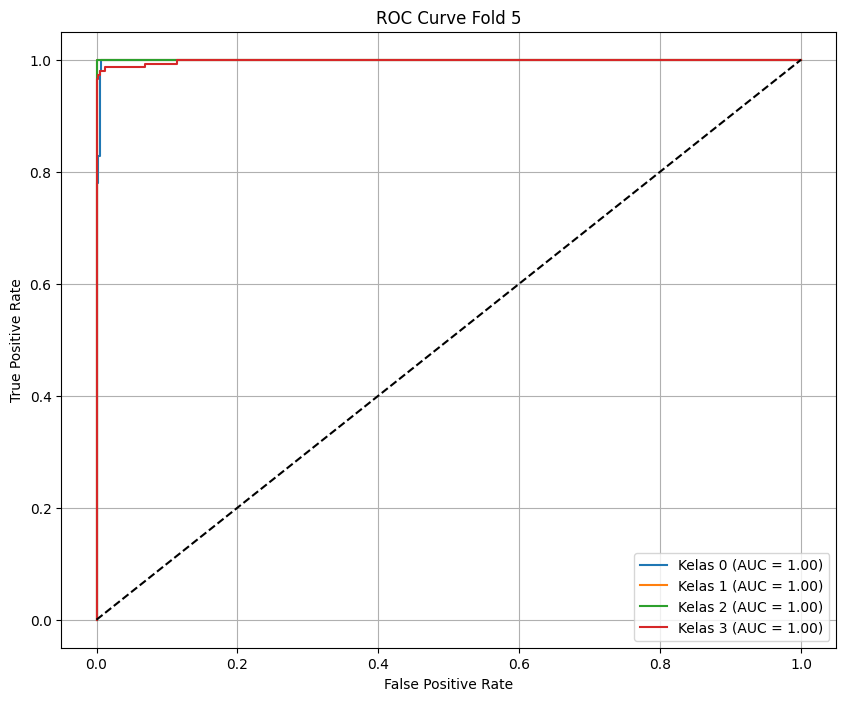

In [12]:
from sklearn.metrics import roc_auc_score, roc_curve, auc
from sklearn.preprocessing import label_binarize

def evaluate_model(fold_count, test_generator, model_path='./keras aug/zoom in/A2/zoom_model_'):
    for fold in range(1, fold_count + 1):
        print('\n\n')
        print(f"Evaluasi KFold {fold} ...")
        
        # Load model
        loaded_model = load_model(f'{model_path}{fold}.keras')

        # Prediksi pada data testing
        predictions = loaded_model.predict(test_generator)

        # Ambil label sebenarnya dari generator
        true_labels = test_generator.classes
        
        # Konversi label ke bentuk one-hot
        num_classes = predictions.shape[1]
        y_true = label_binarize(true_labels, classes=range(num_classes))
        
        # Hitung skor AUC macro
        auc_score = roc_auc_score(y_true, predictions, average='macro', multi_class='ovr')
        print(f"Skor AUC (macro-average) untuk Fold {fold}: {auc_score:.4f}")

        # Plot ROC Curve untuk setiap kelas
        fpr = dict()
        tpr = dict()
        roc_auc = dict()

        for i in range(num_classes):
            fpr[i], tpr[i], _ = roc_curve(y_true[:, i], predictions[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # Plot semua ROC dalam 1 grafik
        plt.figure(figsize=(10, 8))
        for i in range(num_classes):
            plt.plot(fpr[i], tpr[i], label=f'Kelas {i} (AUC = {roc_auc[i]:.2f})')

        plt.plot([0, 1], [0, 1], 'k--')  # Garis diagonal random guess
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve Fold {fold}')
        plt.legend(loc='lower right')
        plt.grid(True)
        plt.show()

evaluate_model(fold_count=5, test_generator=test_generator)

In [26]:
print("Mapping labels:", labels)  # Pastikan urutan label benar
print("True Labels Sample:", all_true_labels[:10])  # Cek label asli
print("Pred Labels Sample:", all_pred_labels[:10])  # Cek hasil prediksi


Mapping labels: ['Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Kawung', 'Ka

In [11]:
model = load_model('./keras aug/zoom in/A2/zoom_model_1.keras')

# Ambil jumlah kelas yang sebenarnya
class_indices = val_generator.class_indices  # Mapping kelas -> indeks
labels = {v: k for k, v in class_indices.items()}  # Indeks -> Nama kelas

# Get total samples in validation set
num_samples = val_generator.samples

# Initialize empty lists to store images, true labels, and predictions
all_images = []
all_true_labels = []
all_pred_labels = []

# Iterate through the entire validation set
for i in range(len(val_generator)):  # Loop through all batches
    val_images, val_labels = next(val_generator)  # Get batch
    predictions = model.predict(val_images)  # Get predictions

    all_images.extend(val_images)  # Store images
    all_true_labels.extend(np.argmax(val_labels, axis=1))  # Store true labels
    all_pred_labels.extend(np.argmax(predictions, axis=1))  # Store predicted labels

# Convert lists to numpy arrays
all_images = np.array(all_images)
all_true_labels = np.array(all_true_labels)
all_pred_labels = np.array(all_pred_labels)

# Debugging: Cek apakah label sudah benar
print("Mapping Labels:", labels)
print("True Labels Sample:", all_true_labels[:10])
print("Pred Labels Sample:", all_pred_labels[:10])

# Plot images with true & predicted labels
fig, axes = plt.subplots(len(all_images) // 10 + 1, 10, figsize=(20, len(all_images) // 2))

for i, ax in enumerate(axes.flat):
    if i >= len(all_images):  
        ax.axis('off')  # Hide empty plots
        continue  

    ax.imshow(all_images[i])  # Show the image
    true_label = labels[all_true_labels[i]]  # Get true class name
    pred_label = labels[all_pred_labels[i]]  # Get predicted class name

    # Display true & predicted labels
    ax.set_title(f"True: {true_label}\nPred: {pred_label}", fontsize=10,
                 color="green" if true_label == pred_label else "red")

    ax.axis('off')

plt.tight_layout()
plt.show()

NameError: name 'val_generator' is not defined

## preprocessing densenet

In [10]:
from tensorflow.keras.applications.densenet import preprocess_input

datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

test_generator = datagen.flow_from_directory(
    directory=test_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False
)

Found 580 images belonging to 4 classes.





Kfold 1 ...


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step


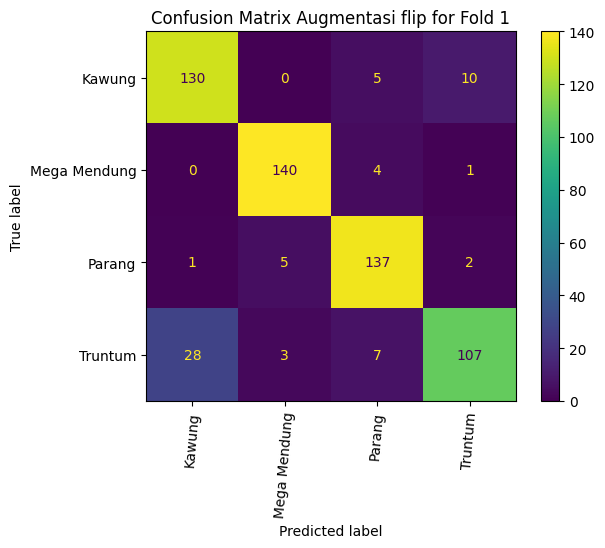

Classification Report
              precision    recall  f1-score   support

      Kawung     0.8176    0.8966    0.8553       145
Mega Mendung     0.9459    0.9655    0.9556       145
      Parang     0.8954    0.9448    0.9195       145
     Truntum     0.8917    0.7379    0.8075       145

    accuracy                         0.8862       580
   macro avg     0.8877    0.8862    0.8845       580
weighted avg     0.8877    0.8862    0.8845       580




Kfold 2 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step


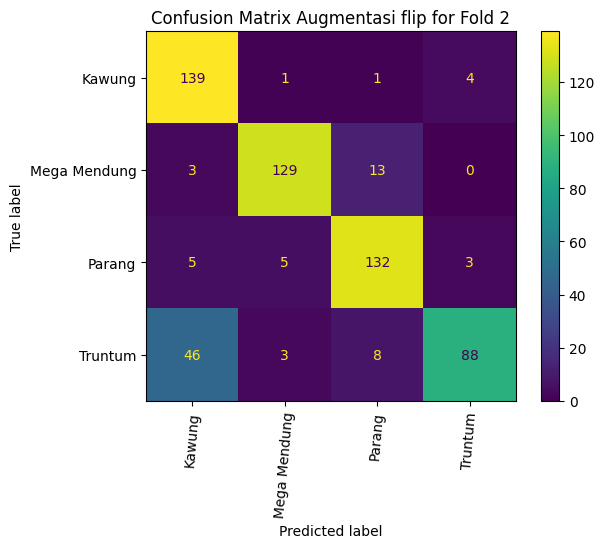

Classification Report
              precision    recall  f1-score   support

      Kawung     0.7202    0.9586    0.8225       145
Mega Mendung     0.9348    0.8897    0.9117       145
      Parang     0.8571    0.9103    0.8829       145
     Truntum     0.9263    0.6069    0.7333       145

    accuracy                         0.8414       580
   macro avg     0.8596    0.8414    0.8376       580
weighted avg     0.8596    0.8414    0.8376       580




Kfold 3 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step


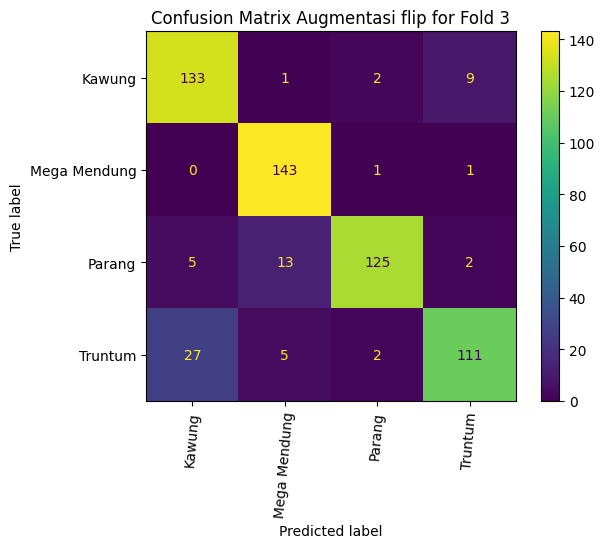

Classification Report
              precision    recall  f1-score   support

      Kawung     0.8061    0.9172    0.8581       145
Mega Mendung     0.8827    0.9862    0.9316       145
      Parang     0.9615    0.8621    0.9091       145
     Truntum     0.9024    0.7655    0.8284       145

    accuracy                         0.8828       580
   macro avg     0.8882    0.8828    0.8818       580
weighted avg     0.8882    0.8828    0.8818       580




Kfold 4 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 51s 2s/step


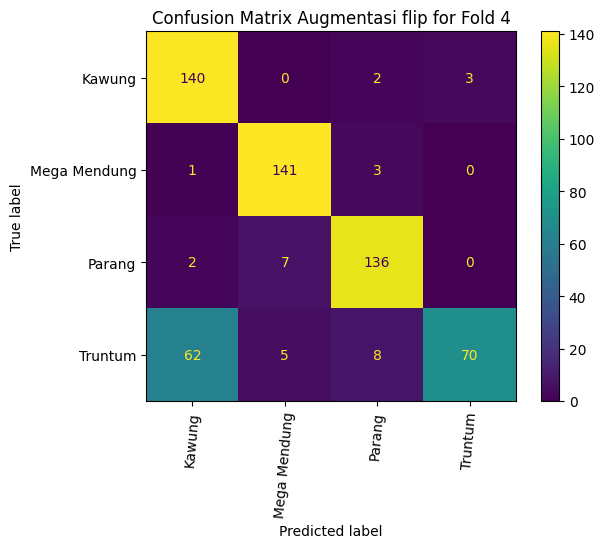

Classification Report
              precision    recall  f1-score   support

      Kawung     0.6829    0.9655    0.8000       145
Mega Mendung     0.9216    0.9724    0.9463       145
      Parang     0.9128    0.9379    0.9252       145
     Truntum     0.9589    0.4828    0.6422       145

    accuracy                         0.8397       580
   macro avg     0.8690    0.8397    0.8284       580
weighted avg     0.8690    0.8397    0.8284       580




Kfold 5 ...
19/19 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step


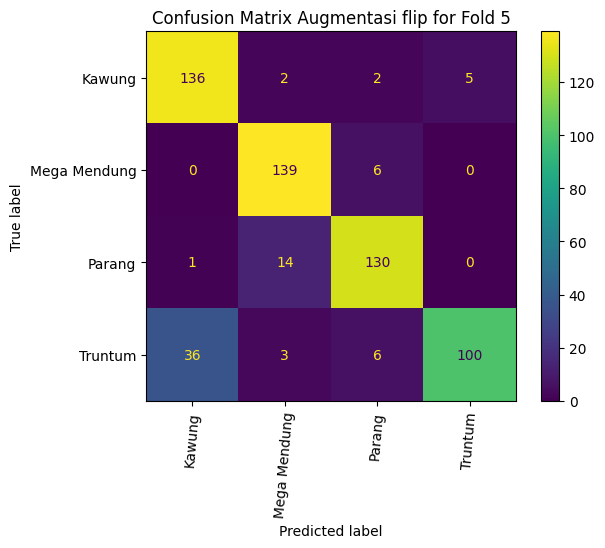

Classification Report
              precision    recall  f1-score   support

      Kawung     0.7861    0.9379    0.8553       145
Mega Mendung     0.8797    0.9586    0.9175       145
      Parang     0.9028    0.8966    0.8997       145
     Truntum     0.9524    0.6897    0.8000       145

    accuracy                         0.8707       580
   macro avg     0.8803    0.8707    0.8681       580
weighted avg     0.8803    0.8707    0.8681       580



In [11]:
def evaluate_model(fold_count, test_generator, model_path='./keras aug/zoom in/A2/zoom_model_'):
    for fold in range(1, fold_count + 1):
        print('\n\n')
        print(f"Kfold {fold} ...")
        loaded_model = load_model(f'{model_path}{fold}.keras')
        
        predictions = loaded_model.predict(test_generator)
        
        # Get class labels
        class_labels = list(test_generator.class_indices.keys())
        
        # Get the true and predicted class indices
        y_true = test_generator.classes
        y_pred = np.argmax(predictions, axis=1)
        
        # Confusion Matrix Display
        conf_matrix = confusion_matrix(y_true, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_labels)
        
        disp.plot(cmap='viridis')
        plt.title(f'Confusion Matrix Augmentasi flip for Fold {fold}')
        plt.xticks(rotation=85)
        plt.show()
        
        class_report = classification_report(y_true, y_pred, target_names=class_labels, digits=4)
        print('Classification Report')
        print(class_report)

evaluate_model(fold_count=5, test_generator=test_generator)

# dataset clean (1840 (460 x 2) + 292 (73 x 4) + 232 (58 x 4) = 2364) optimasi hyperparameter + augmentasi zoom in

In [30]:
# Lokasi dataset asli
base_dir = r'..\..\dataset\Dataset 1444'
train_dir = r'..\..\dataset\Batik Djawa\train'
test_dir = r'..\..\dataset\Batik Djawa\test'
val_dir = r'..\..\dataset\Batik Djawa\val'

os.makedirs(val_dir, exist_ok=True)

Jumlah data Kawung: 58
Jumlah data Mega Mendung: 58
Jumlah data Parang: 58
Jumlah data Truntum: 58
Jumlah Dataset : 232


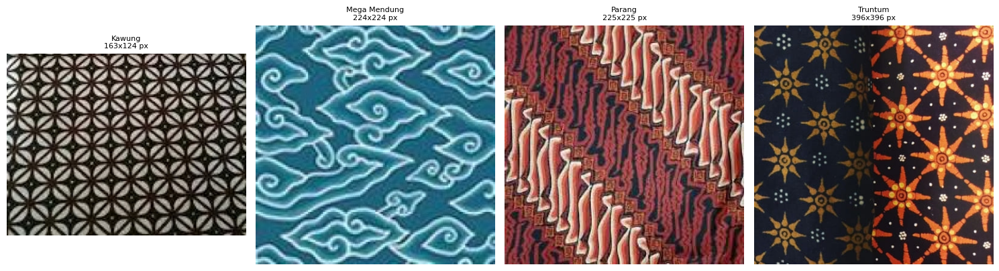

In [47]:
# ## Menampilkan Jumlah Dataset dari setiap kelas
total_dataset = 0
dataset_dir = val_dir
folders = [folder for folder in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, folder))]
fig, axes = plt.subplots(1, len(folders), figsize=(15, 5))  # Mengatur jumlah kolom berdasarkan jumlah folder

for i, folder in enumerate(folders):
    folder_path = os.path.join(dataset_dir, folder)
    image_count = len(os.listdir(folder_path))
    total_dataset += image_count
    print(f"Jumlah data {folder}: {image_count}")

    # Menampilkan foto secara acak dari setiap folder
    try:
        image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
        if image_files:
            random_image = random.choice(image_files)
            image_path = os.path.join(folder_path, random_image)
            img = Image.open(image_path)
            width, height = img.size

            # Menampilkan gambar di subplot horizontal
            axes[i].imshow(img)
            axes[i].set_title(f"{folder}\n{width}x{height} px", fontsize=8)
            axes[i].axis('off')
        else:
            print(f"Tidak ada gambar yang ditemukan di folder '{folder}'")
    except Exception as e:
        print(f"Error menampilkan gambar dari folder '{folder}': {e}")


print(f"Jumlah Dataset : {total_dataset}")
plt.tight_layout()
plt.show()

In [17]:
IMAGE_WIDTH = 224
IMAGE_HEIGHT = 224
IMAGE_SIZE = (IMAGE_WIDTH, IMAGE_HEIGHT)
BATCH_SIZE = 32
COLOR_CHANNELS = 3

In [20]:
# Fungsi preprocessing menggunakan CLAHE
# CLAHE akan meningkatkan kontras gambar sehingga fitur lebih terlihat
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
def preprocess_image(image):
    # Konversi nilai dari 0-1 ke 0-255 dan ubah tipe data ke uint8
    image = (image * 255).astype(np.uint8)
    
    # Konversi ke LAB color space
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    
    # Pisahkan channel L, A, dan B
    l, a, b = cv2.split(lab)
    
    # Terapkan CLAHE pada channel L (grayscale)
    l = clahe.apply(l)
    
    # Gabungkan kembali ke LAB
    lab = cv2.merge((l, a, b))
    
    # Konversi kembali ke RGB
    image = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
    
    # Normalisasi kembali ke 0-1
    image = image / 255.0
    return image

In [18]:
# Ambil semua file gambar dari dataset asli
file_paths = []
labels = []

# Ambil file dari train_dir (data asli)
for label in os.listdir(train_dir):
    label_path = os.path.join(train_dir, label)
    if os.path.isdir(label_path):
        for file in os.listdir(label_path):
            file_paths.append(os.path.join(label_path, file))
            labels.append(label)

# Map label ke integer
unique_labels = sorted(set(labels))
label_map = {label: idx for idx, label in enumerate(unique_labels)}
integer_labels = [label_map[label] for label in labels]

print(f"Jumlah total gambar: {len(file_paths)}")
print(unique_labels)
print(len(label_map))
print(label_map)
print(integer_labels)

Jumlah total gambar: 1152
['Kawung', 'Mega Mendung', 'Parang', 'Truntum']
4
{'Kawung': 0, 'Mega Mendung': 1, 'Parang': 2, 'Truntum': 3}
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [21]:
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_image,
    validation_split=0.2
)

train_generator = datagen.flow_from_directory(
    directory=train_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    subset='training'
)

val_generator = datagen.flow_from_directory(
    directory=train_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    subset='validation'
)

Found 924 images belonging to 4 classes.
Found 228 images belonging to 4 classes.


In [ ]:
# # Direktori dataset awal (hanya berisi data train)

# # Membuat folder validasi jika belum ada
# os.makedirs(val_dir, exist_ok=True)

# # Mendapatkan daftar kelas (subfolder dalam dataset train)
# classes = [d for d in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, d))]

# # Membagi data per kelas
# for cls in classes:
#     cls_train_path = os.path.join(train_dir, cls)
#     cls_val_path = os.path.join(val_dir, cls)
    
#     # Membuat folder kelas di validasi
#     os.makedirs(cls_val_path, exist_ok=True)
    
#     # Mendapatkan daftar file gambar dalam kelas
#     images = os.listdir(cls_train_path)
    
#     # Membagi gambar menjadi 80% train dan 20% validasi
#     train_imgs, val_imgs = train_test_split(images, test_size=0.2, random_state=42)
    
#     # Memindahkan file ke folder validasi
#     for img in val_imgs:
#         shutil.move(os.path.join(cls_train_path, img), os.path.join(cls_val_path, img))

# print("Pembagian dataset selesai. 20% data train dipindahkan ke validasi.")


Pembagian dataset selesai. 20% data train dipindahkan ke validasi.


Jumlah data Kawung: 230
Jumlah data Mega Mendung: 230
Jumlah data Parang: 230
Jumlah data Truntum: 230
Jumlah Dataset : 920


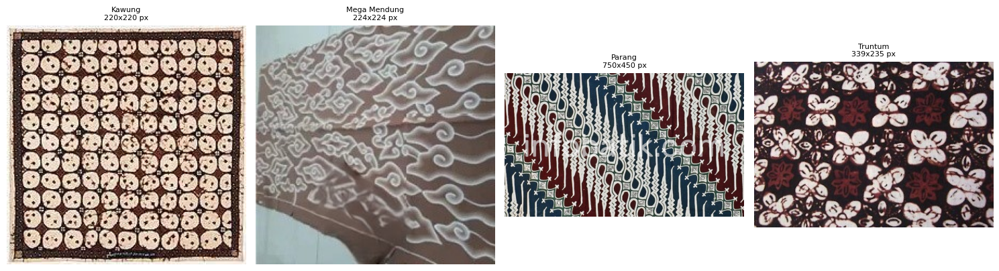

In [35]:
# ## Menampilkan Jumlah Dataset dari setiap kelas
total_dataset = 0
dataset_dir = train_dir
folders = [folder for folder in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, folder))]
fig, axes = plt.subplots(1, len(folders), figsize=(15, 5))  # Mengatur jumlah kolom berdasarkan jumlah folder

for i, folder in enumerate(folders):
    folder_path = os.path.join(dataset_dir, folder)
    image_count = len(os.listdir(folder_path))
    total_dataset += image_count
    print(f"Jumlah data {folder}: {image_count}")

    # Menampilkan foto secara acak dari setiap folder
    try:
        image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
        if image_files:
            random_image = random.choice(image_files)
            image_path = os.path.join(folder_path, random_image)
            img = Image.open(image_path)
            width, height = img.size

            # Menampilkan gambar di subplot horizontal
            axes[i].imshow(img)
            axes[i].set_title(f"{folder}\n{width}x{height} px", fontsize=8)
            axes[i].axis('off')
        else:
            print(f"Tidak ada gambar yang ditemukan di folder '{folder}'")
    except Exception as e:
        print(f"Error menampilkan gambar dari folder '{folder}': {e}")


print(f"Jumlah Dataset : {total_dataset}")
plt.tight_layout()
plt.show()

In [ ]:
# # Menambahkan dataset augmentasi di lokal

# datagen = ImageDataGenerator(zoom_range=0.2,
#     fill_mode='wrap')

# for label in os.listdir(train_dir):
#     label_path = os.path.join(train_dir, label)
    
#     if os.path.isdir(label_path):
#         for file in os.listdir(label_path):
#             img_path = os.path.join(label_path, file)

#             # Load gambar
#             img = load_img(img_path)
#             img_array = img_to_array(img)
#             img_array = np.expand_dims(img_array, axis=0)

#             # Hasil augmentasi
#             aug_iter = datagen.flow(img_array, batch_size=1)

#             for i in range(1):
#                 aug_img = next(aug_iter)[0].astype(np.uint8)
#                 aug_img_pil = array_to_img(aug_img)

#                 # Simpan gambar hasil augmentasi di lokasi asli
#                 save_path = os.path.join(label_path, f'aug_{file}')
#                 aug_img_pil.save(save_path)

# print("Augmentasi selesai dan gambar berhasil disimpan.")

Augmentasi selesai dan gambar berhasil disimpan.


Jumlah data Kawung: 460
Jumlah data Mega Mendung: 460
Jumlah data Parang: 460
Jumlah data Truntum: 460
Jumlah Dataset : 1840


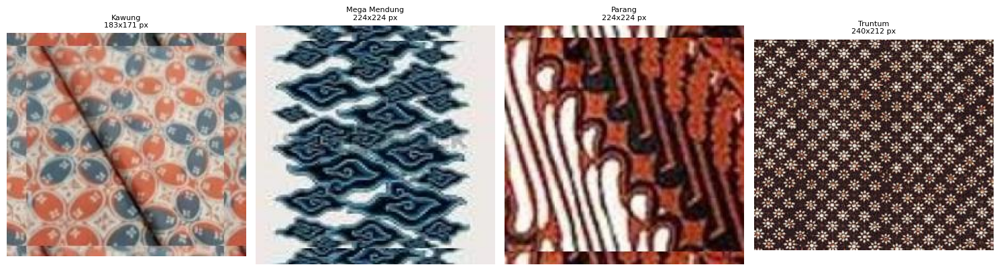

In [45]:
# ## Menampilkan Jumlah Dataset dari setiap kelas
total_dataset = 0
dataset_dir = train_dir
folders = [folder for folder in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, folder))]
fig, axes = plt.subplots(1, len(folders), figsize=(15, 5))  # Mengatur jumlah kolom berdasarkan jumlah folder

for i, folder in enumerate(folders):
    folder_path = os.path.join(dataset_dir, folder)
    image_count = len(os.listdir(folder_path))
    total_dataset += image_count
    print(f"Jumlah data {folder}: {image_count}")

    # Menampilkan foto secara acak dari setiap folder
    try:
        image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
        if image_files:
            random_image = random.choice(image_files)
            image_path = os.path.join(folder_path, random_image)
            img = Image.open(image_path)
            width, height = img.size

            # Menampilkan gambar di subplot horizontal
            axes[i].imshow(img)
            axes[i].set_title(f"{folder}\n{width}x{height} px", fontsize=8)
            axes[i].axis('off')
        else:
            print(f"Tidak ada gambar yang ditemukan di folder '{folder}'")
    except Exception as e:
        print(f"Error menampilkan gambar dari folder '{folder}': {e}")


print(f"Jumlah Dataset : {total_dataset}")
plt.tight_layout()
plt.show()

In [56]:
# Ambil semua file gambar dari dataset asli
file_paths = []
labels = []

# Ambil file dari train_dir (data asli)
for label in os.listdir(train_dir):
    label_path = os.path.join(train_dir, label)
    if os.path.isdir(label_path):
        for file in os.listdir(label_path):
            file_paths.append(os.path.join(label_path, file))
            labels.append(label)

# Map label ke integer
unique_labels = sorted(set(labels))
label_map = {label: idx for idx, label in enumerate(unique_labels)}
integer_labels = [label_map[label] for label in labels]

print(f"Jumlah total gambar: {len(file_paths)}")
print(unique_labels)
print(len(label_map))
print(label_map)
print(integer_labels)

Jumlah total gambar: 1840
['Kawung', 'Mega Mendung', 'Parang', 'Truntum']
4
{'Kawung': 0, 'Mega Mendung': 1, 'Parang': 2, 'Truntum': 3}
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [57]:
# Fungsi preprocessing menggunakan CLAHE
# CLAHE akan meningkatkan kontras gambar sehingga fitur lebih terlihat
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
def preprocess_image(image):
    # Konversi nilai dari 0-1 ke 0-255 dan ubah tipe data ke uint8
    image = (image * 255).astype(np.uint8)
    
    # Konversi ke LAB color space
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    
    # Pisahkan channel L, A, dan B
    l, a, b = cv2.split(lab)
    
    # Terapkan CLAHE pada channel L (grayscale)
    l = clahe.apply(l)
    
    # Gabungkan kembali ke LAB
    lab = cv2.merge((l, a, b))
    
    # Konversi kembali ke RGB
    image = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
    
    # Normalisasi kembali ke 0-1
    image = image / 255.0
    return image

In [58]:
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_image
)

test_generator = datagen.flow_from_directory(
    directory=test_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

Found 292 images belonging to 4 classes.



🚀 Training Fold 1 😌

Found 1840 images belonging to 4 classes.
Found 232 images belonging to 4 classes.
Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 197s 3s/step - accuracy: 0.4748 - loss: 1.2762 - val_accuracy: 0.9138 - val_loss: 0.4331 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 167s 3s/step - accuracy: 0.7654 - loss: 0.5790 - val_accuracy: 0.9397 - val_loss: 0.2048 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 175s 3s/step - accuracy: 0.8724 - loss: 0.3526 - val_accuracy: 0.9612 - val_loss: 0.1334 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 180s 3s/step - accuracy: 0.9228 - loss: 0.2228 - val_accuracy: 0.9569 - val_loss: 0.1442 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 185s 3s/step - accuracy: 0.9397 - loss: 0.1883 - val_accuracy: 0.9483 - val_loss: 0.1506 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9737 - loss: 0.0935
Epoch 6: ReduceLROnPlateau reducing l

C:\Users\ASUS\AppData\Local\Temp\ipykernel_21516\3977321146.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_21516\3977321146.py:115: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


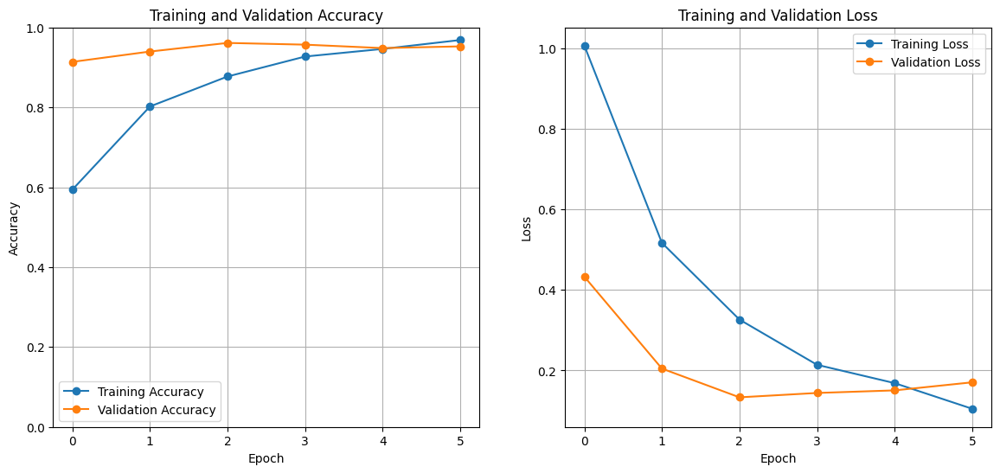

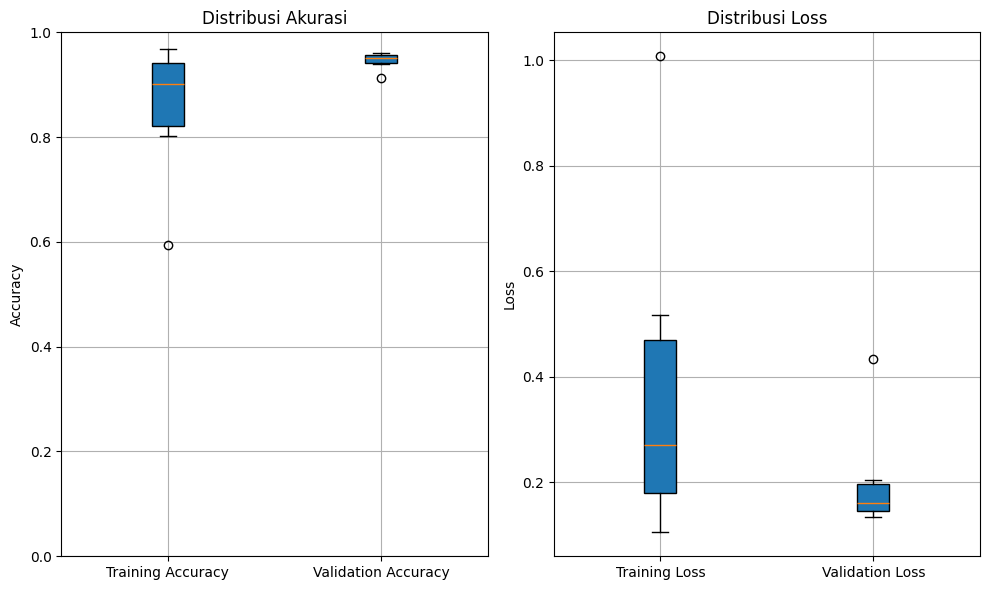


🚀 Training Fold 2 😌

Found 1840 images belonging to 4 classes.
Found 232 images belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 247s 4s/step - accuracy: 0.4774 - loss: 1.2940 - val_accuracy: 0.9267 - val_loss: 0.3820 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.7664 - loss: 0.5675 - val_accuracy: 0.9483 - val_loss: 0.1921 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 185s 3s/step - accuracy: 0.8661 - loss: 0.3824 - val_accuracy: 0.9483 - val_loss: 0.1498 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9025 - loss: 0.2803 - val_accuracy: 0.9569 - val_loss: 0.1302 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 157s 3s/step - accuracy: 0.9326 - loss: 0.1924 - val_accuracy: 0.9569 - val_loss: 0.1406 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 151s 3s/step - accuracy: 0.9577 - loss: 0.1335 - val_accuracy: 0.9569 - val_loss: 0.1569 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9681 - 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_21516\3977321146.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_21516\3977321146.py:115: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


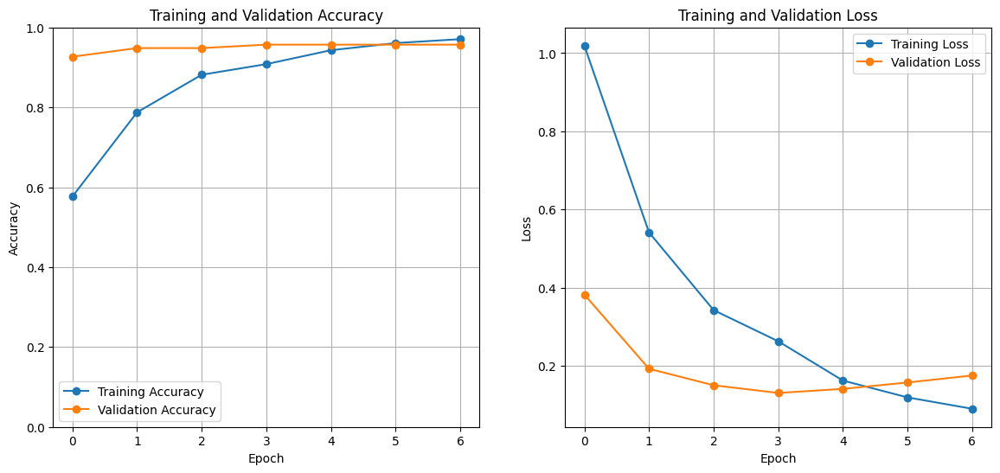

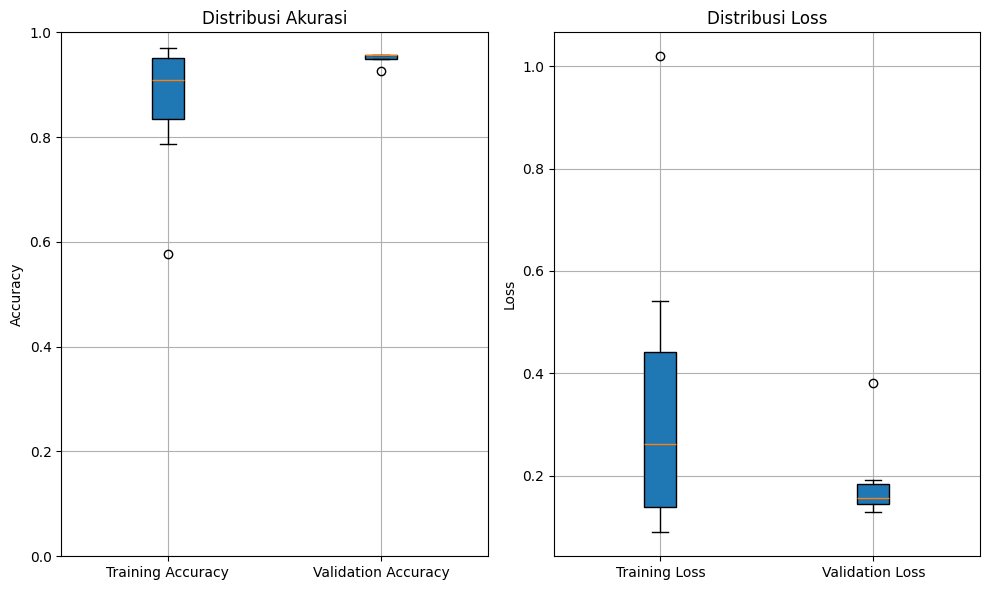


🚀 Training Fold 3 😌

Found 1840 images belonging to 4 classes.
Found 232 images belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 197s 3s/step - accuracy: 0.4288 - loss: 1.3037 - val_accuracy: 0.9052 - val_loss: 0.4031 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 203s 4s/step - accuracy: 0.7610 - loss: 0.5986 - val_accuracy: 0.9224 - val_loss: 0.2572 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 190s 3s/step - accuracy: 0.8422 - loss: 0.4008 - val_accuracy: 0.9353 - val_loss: 0.1740 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.8951 - loss: 0.2663 - val_accuracy: 0.9569 - val_loss: 0.1522 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 158s 3s/step - accuracy: 0.9420 - loss: 0.1871 - val_accuracy: 0.9440 - val_loss: 0.1640 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 168s 3s/step - accuracy: 0.9573 - loss: 0.1326 - val_accuracy: 0.9397 - val_loss: 0.1809 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9672 - 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_21516\3977321146.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_21516\3977321146.py:115: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


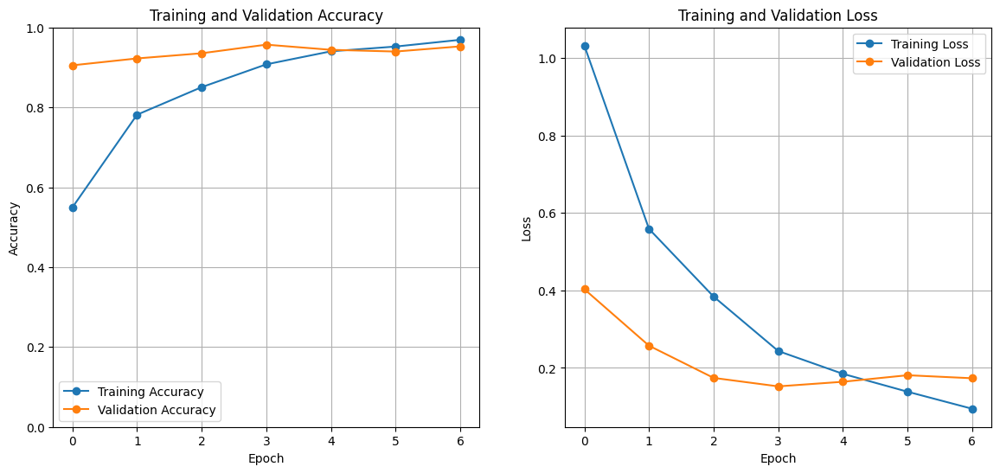

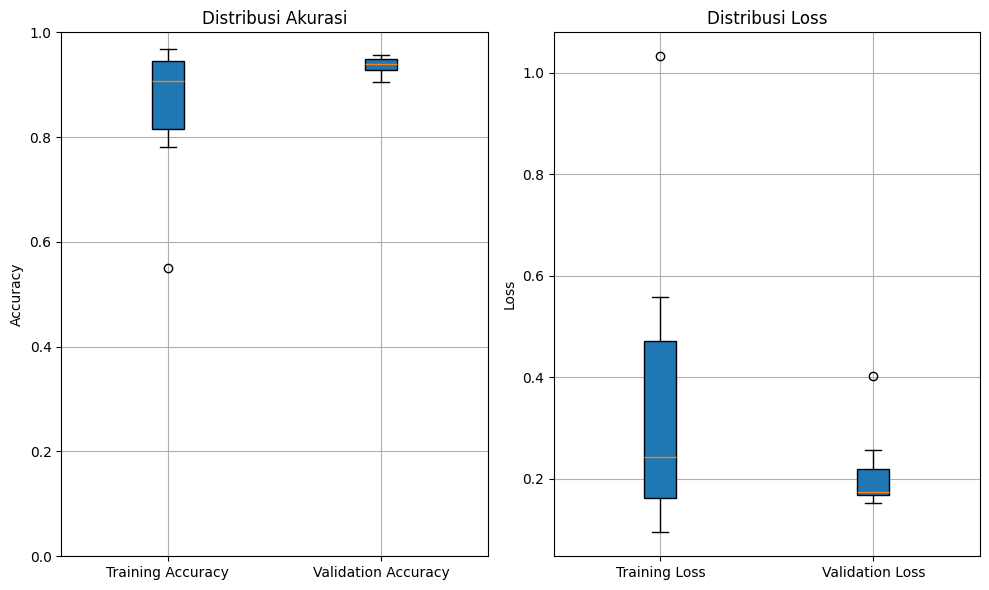


🚀 Training Fold 4 😌

Found 1840 images belonging to 4 classes.
Found 232 images belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 194s 3s/step - accuracy: 0.4241 - loss: 1.3953 - val_accuracy: 0.9138 - val_loss: 0.4885 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.7619 - loss: 0.6214 - val_accuracy: 0.9310 - val_loss: 0.2411 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 170s 3s/step - accuracy: 0.8382 - loss: 0.4251 - val_accuracy: 0.9397 - val_loss: 0.1684 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 163s 3s/step - accuracy: 0.9057 - loss: 0.2767 - val_accuracy: 0.9526 - val_loss: 0.1425 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9378 - loss: 0.1774 - val_accuracy: 0.9440 - val_loss: 0.1772 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.9589 - loss: 0.1348 - val_accuracy: 0.9569 - val_loss: 0.1693 - learning_rate: 1.0000e-04
Epoch 7/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9576 

C:\Users\ASUS\AppData\Local\Temp\ipykernel_21516\3977321146.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_21516\3977321146.py:115: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


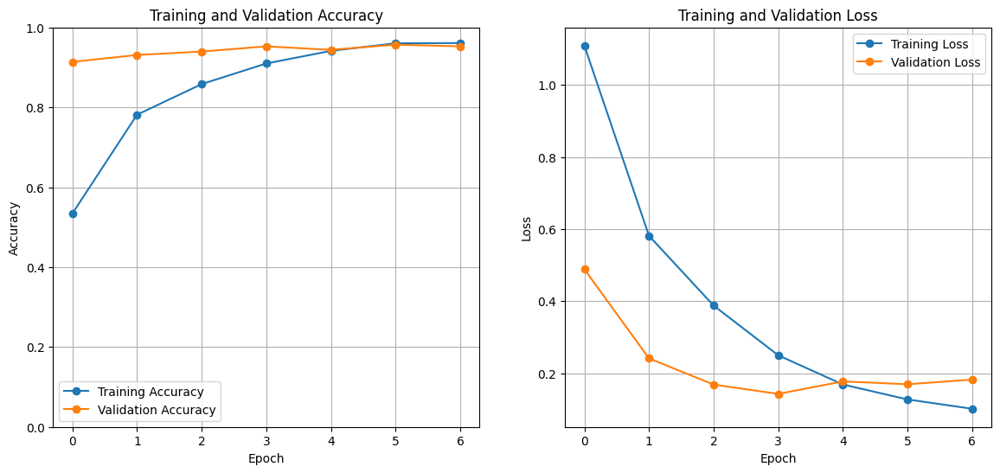

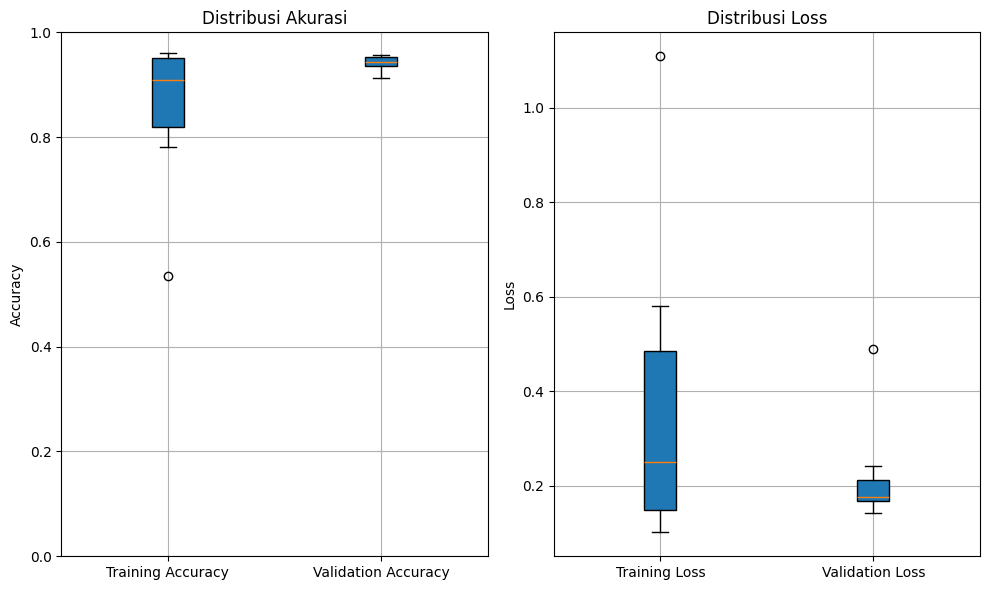


🚀 Training Fold 5 😌

Found 1840 images belonging to 4 classes.
Found 232 images belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 183s 3s/step - accuracy: 0.3870 - loss: 1.3738 - val_accuracy: 0.9095 - val_loss: 0.4786 - learning_rate: 1.0000e-04
Epoch 2/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 155s 3s/step - accuracy: 0.7627 - loss: 0.6299 - val_accuracy: 0.9440 - val_loss: 0.2821 - learning_rate: 1.0000e-04
Epoch 3/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 154s 3s/step - accuracy: 0.8325 - loss: 0.4600 - val_accuracy: 0.9483 - val_loss: 0.2220 - learning_rate: 1.0000e-04
Epoch 4/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 156s 3s/step - accuracy: 0.8876 - loss: 0.3157 - val_accuracy: 0.9440 - val_loss: 0.2462 - learning_rate: 1.0000e-04
Epoch 5/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9471 - loss: 0.1666 - val_accuracy: 0.9397 - val_loss: 0.2957 - learning_rate: 1.0000e-04
Epoch 6/25
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9435 - loss: 0.1500
Epoch 6: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
58/58 ━━━━━━━━━━━━━━━━━━━━ 158s 3s/step - accuracy: 0.9437 - loss:

C:\Users\ASUS\AppData\Local\Temp\ipykernel_21516\3977321146.py:106: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_21516\3977321146.py:115: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


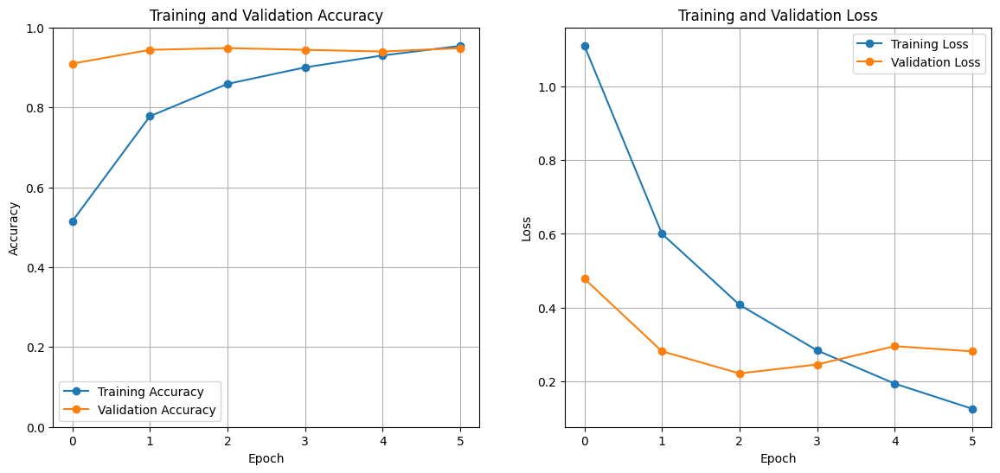

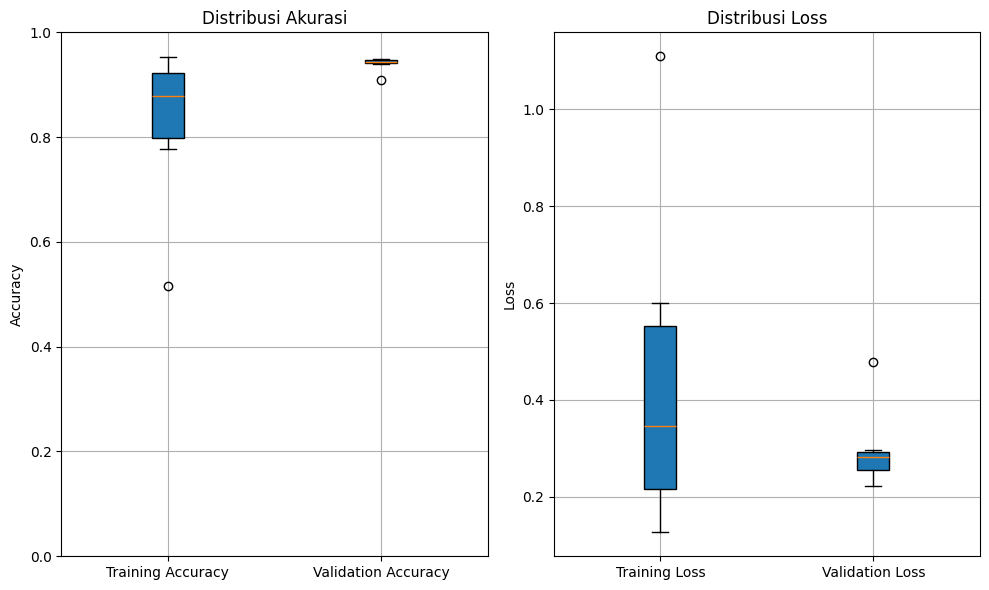

In [ ]:
# Tentukan jumlah fold
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Direktori untuk menyimpan model terbaik
best_model_dir = r'.\keras aug\zoom in\A3' 

# Fungsi untuk membuat model
def create_model(num_classes):
    base_model = DenseNet169(weights='imagenet', include_top=False, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, COLOR_CHANNELS))

    for layer in base_model.layers[:-10]:  # Membekukan semua kecuali 10 lapisan terakhir
        layer.trainable = False

    x = base_model.output
    x = Conv2D(32, (4, 4), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu', name='FC2')(x) 
    x = Dropout(0.3)(x)
    x = Flatten()(x)
    x = Dropout(0.3)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer=RMSprop(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
    
    # model.summary()
    return model

EPOCHS = 25
fold_var = 1

# Looping untuk setiap fold
for fold_var in range(1, 6):
    print(f"\n🚀 Training Fold {fold_var} 😌\n")

    train_generator = datagen.flow_from_directory(
        directory=train_dir,
        target_size=IMAGE_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=True
    )
    
    val_generator = datagen.flow_from_directory(
        directory=val_dir,
        target_size=IMAGE_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=True
    )

    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)
    model_checkpoint = ModelCheckpoint(os.path.join(best_model_dir, f'best_model_{fold_var}.keras'), monitor='val_loss', save_best_only=True)
    
    # Buat Learning Rate Scheduler
    lr_scheduler = ReduceLROnPlateau(
        monitor='val_accuracy',     
        factor=0.1,             
        patience=3,             # Jika val_loss tidak membaik setelah 3 epoch, LR akan diturunkan
        min_lr=1e-6,            
        verbose=1               
    )

    num_classes = len(label_map)
    model = create_model(num_classes)

    # Training Model
    history = model.fit(
        train_generator,
        epochs=EPOCHS,
        validation_data=val_generator,
        callbacks=[early_stopping, model_checkpoint, lr_scheduler]
    )

    # Plot grafik akurasi dan loss dengan format yang lebih baik
    plt.figure(figsize=(14, 6))

    # Plot Training and Validation Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1)  # Menentukan rentang y antara 0 dan 1 (untuk akurasi)
    plt.grid(True)
    plt.legend()

    # Plot Training and Validation Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.legend()

    # Buat figure Box Plot
    plt.figure(figsize=(10, 6))
    
    # Boxplot untuk Training & Validation Accuracy
    plt.subplot(1, 2, 1)
    plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
                labels=['Training Accuracy', 'Validation Accuracy'])
    plt.title('Distribusi Akurasi')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1)
    plt.grid(True)
    
    # Boxplot untuk Training & Validation Loss
    plt.subplot(1, 2, 2)
    plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,
                labels=['Training Loss', 'Validation Loss'])
    plt.title('Distribusi Loss')
    plt.ylabel('Loss')
    plt.grid(True)

    # Tampilkan grafik
    plt.tight_layout()
    plt.show()

    # menambah fold
    fold_var += 1